to do : toggle button for the chi2 pvalue/score toggling


to do : add forward recursive and backward recursive feature selection methods just so people have a comparison point

to do: include tsne with pca

TO DO : add  ALE plots

**TO DO** : talk about kernel widths in LIME and maybe show an example of how it might be bad using linear regression and some continuous features from the dataset.

maybe choose the "most predictive" feature and plot the label and then its lime explainer approximation.

TO DO : should include cross-validation probably (not in the platform though)

# Aim:

The aim of this notebook is to show a user case in which explainability and interpretability of ML models, as well as their inputs and outputs, is important. Since the end-users of the CliniColab platform are clinicians, the dataset used will be a clinical one.

# Machine learning overview:
- the goal is to train a model on a dataset. A model needs data to be trained on, and data to be evaluated on. This is why the dataset will be split into two, respectively a training and a testing set.


- There are two broad types of ML: unsupervised and supervised. Since we have an idea of the thing we want to predict, we are doing supervised ML.
- There are different kinds of supervised ML, classification and regression. Since we are predicting categories (a categorical outcome rather than a continuous one) we are doing classification.
- there are many different kinds of models with their own application settings, weaknesses and strengths. In our case, we will use random forest algorithm, which is suited to most classification problems.

**ADD IN**

We can use Logistic Regression to validate our assumptions and decisions for feature creating and completing goals. This can be done by calculating the coefficient of the features in the decision function.

Positive coefficients increase the log-odds of the response (and thus increase the probability), and negative coefficients decrease the log-odds of the response (and thus decrease the probability).

# Statistics reminder:

Bradford-Hill criteria:
- Strength (effect size): A small association does not mean that there is not a causal effect, though the larger the association, the more likely that it is causal.
- Consistency (reproducibility): Consistent findings observed by different persons in different places with different samples strengthens the likelihood of an effect.
- Specificity: Causation is likely if there is a very specific population at a specific site and disease with no other likely explanation. The more specific an association between a factor and an effect is, the bigger the probability of a causal relationship.[1]
- Temporality: The effect has to occur after the cause (and if there is an expected delay between the cause and expected effect, then the effect must occur after that delay).
- Biological gradient (dose-response relationship): Greater exposure should generally lead to greater incidence of the effect. However, in some cases, the mere presence of the factor can trigger the effect. In other cases, an inverse proportion is observed: greater exposure leads to lower incidence.[1]
- Plausibility: A plausible mechanism between cause and effect is helpful (but Hill noted that knowledge of the mechanism is limited by current knowledge).
- Coherence: Coherence between epidemiological and laboratory findings increases the likelihood of an effect. However, Hill noted that "... lack of such [laboratory] evidence cannot nullify the epidemiological effect on associations".
- Experiment: "Occasionally it is possible to appeal to experimental evidence".
- Analogy: The use of analogies or similarities between the observed association and any other associations.
- Some authors consider, also, Reversibility: If the cause is deleted then the effect should disappear as well.

# Importing dataset and libraries

The dataset we are using is a collection of patient informations from different clinics. The different informations are categorized as different features (organized per columns), and the different patients are organized per row.

In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
import sklearn.metrics as metrics

import time

import os

import eli5

from sklearn import tree
import graphviz

from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots

import shap

import warnings

import scipy as sp

import lime
from lime import lime_tabular
import lightgbm as lgb
import seaborn as sns

import imblearn

C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.
C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\tensorflow\python\framework\dtypes.py:526: F

In [2]:
os.listdir("../data/alge_data/")

['epoct_ezvir_05dec2018_dictionary.csv',
 'epoct_ezvir_05dec2018_labeled.csv',
 'epoct_ezvir_05dec2018_unlabeled - Edit.csv',
 'epoct_ezvir_05dec2018_unlabeled.csv',
 'epoct_ezvir_05dec2018_unlabeled_Jan.csv']

In [3]:
data = pd.read_csv("../data/alge_data/epoct_ezvir_05dec2018_unlabeled_Jan.csv")

In [4]:
data_labels = pd.read_csv("../data/alge_data/epoct_ezvir_05dec2018_dictionary.csv", encoding="unicode_escape")

# Getting into data analysis

### Selecting which features we will use

Some reminders:
- the data will be split into 2: features ("X") and label ("y"). We will be trying to predict labels given their features.
- the label is binary, indicating presence (1) or absence (0) of malaria for a given patient/row.
- the features are varied, some categorical, some numerical.

The data we are using is tabular. We have around 130 total features (columns) and around 3000 total data instances (rows). Some of the features are missing, at various degrees,  for various data points.

We will select a subset of the available features in an effort to make the explanation easier to understand.
Below is the list of selected features:

In [5]:
for i in data.columns:
    print(i)

date_d30_01
date_season_meteo
dem_age_int
dem_child_house
dem_district
dem_mat_educat
dem_sex
dem_ward_ila
dem_ward_kin
dem_ward_tem
dxlab_anemia_mild
dxlab_anemia_mild_hl
dxlab_anemia_mod
dxlab_anemia_sev
dxlab_hbss
dxlab_hiv
dxlab_malaria_hi
dxlab_malaria_hist
dxlab_malaria_hsrdt
dxlab_malaria_low
dxlab_malaria_mod
dxlab_malaria_rdt
dxlab_malaria_vlow
dxlab_typhoid
dxlab_uti_dip
dxlab_uti_dip_d0
dxlab_uti_dip_d3
dxlab_uti_dip_d7
dxlab_uti_ucx
hist_hiv_mom
hist_pmct_reg
hist_pmh_cat
hist_ttt_before
hist_vac_pcv1
hist_vac_pcv2
hist_vac_pcv3
lab_bcx_path_d0
lab_bcx_path_d1_7
lab_bcx_sensi_01_d0
lab_bcx_sensi_01_d1_7
lab_crp_d0
lab_crp_d3
lab_det
lab_hb10_d0
lab_hb5_d0
lab_hb6_d0
lab_hb7_d0
lab_hb_d0
lab_hb_d3
lab_hbcat_d0
lab_hbss
lab_hiv_rdt
lab_hrp2_01
lab_hrp2_cat
lab_hrp2_load
lab_lactate1_d0
lab_malaria_any_d0
lab_malaria_hsrdt_d0
lab_malaria_rdt_d0
lab_malaria_rdtbad_d0
lab_malaria_rdtbad_d3
lab_pct_d0
lab_pct_d3
lab_pctcat_d0
lab_pglucose_d0
lab_pglucose_d3
lab_typhoid_bcx
lab_ty

In [6]:
selected = ["date_season_meteo",
           "dem_age_int",
           "dem_sex",
           "dem_ward_kin",
            "dxlab_malaria_hi",
            "dxlab_malaria_low",
            "dxlab_malaria_hsrdt",
            "lab_malaria_any_d0",
            "sign_measles",
            "sign_pallor",
            "sign_skin_sev",
            "sign_skininf",
            "signv_temp_d0",
            "symp_abdopain",
            "symp_bloodstool",
            "symp_cough",
            "symp_diarrhea",
            "symp_dyspnea",
            "symp_eye",
            "symp_feveronly",
            "symp_fev24h",
            "symp_liquidstool",
            "symp_pharyngitis",
            "symp_skin",
            "symp_vomit",
            "signv_rr1_d0",
            "days_of_fever",           
]

In [7]:
data_selected = data[selected]

In [61]:
examples = ["date_season_meteo",
           "dem_age_int",
           "dem_sex",
            "signv_temp_d0",
            "symp_abdopain",
            "symp_cough",
            "signv_rr1_d0",
            "lab_malaria_any_d0"        
]
data[examples].dropna().reset_index(drop=True)

,date_season_meteo,dem_age_int,dem_sex,signv_temp_d0,symp_abdopain,symp_cough,signv_rr1_d0,lab_malaria_any_d0
0,2,11,1,38.200000,0.0,0,35.0,0.0
1,2,8,2,38.200001,0.0,1,42.0,0.0
2,2,9,2,38.599998,0.0,0,36.0,0.0
3,2,7,2,38.400000,1.0,0,38.0,0.0
4,2,10,2,38.500000,0.0,0,38.0,0.0
5,2,12,2,37.599998,0.0,1,32.0,0.0
6,2,4,1,37.500000,0.0,1,36.0,0.0
7,2,8,1,38.200000,0.0,1,55.0,0.0
8,2,23,1,37.800000,1.0,0,36.0,0.0
9,2,17,2,37.600000,0.0,0,41.0,0.0


ADDITIONAL INFORMATION: 
**TO DO**
- `dem_age_int` is in months?
- `dem_sex`: 1 vs 2, which one is which?
- `date_season_meteo` is split into 3 values: 0 => dry, 1 => rainy, 2 => post-rainy

In [8]:
data_unique = pd.DataFrame([[data_selected.columns[i], 
                             data_selected[x].nunique(), 
                             data_selected[x].isnull().sum(),
                             data_selected[x].min(),
                             data_selected[x].max(),
                             list(data_selected[x].value_counts(normalize=False).values)
                            ] for i,x in enumerate(data_selected.columns)],
                          columns = ["name", "nunique","nnull","min","max","counts"])
data_unique = data_unique.merge(data_labels, on = "name").drop(["position","type","isnumeric","format","vallab"],axis=1)
data_unique["data_type"] = data_unique["nunique"].apply(lambda x: "cat" if x==2 else "num")
data_unique["data_type"][data_unique["name"]=="date_season_meteo"]="multicat"

data_unique["ratio"]=data_unique.apply(lambda x: x["counts"][0]/x["counts"][1]\
                                        if (x["counts"][1]!=0 and x["data_type"]=="cat") else 0, axis=1)
data_unique["ratio"]= data_unique.apply(lambda x: None if x["data_type"]!="cat" else x["ratio"], axis=1)
n_patients=len(data_selected)
data_unique

,name,nunique,nnull,min,max,counts,varlab,data_type,ratio
0,date_season_meteo,3,0,1.0,3.0,"[1715, 858, 619]",Season according to meteorological data,multicat,NaN
1,dem_age_int,58,0,2.0,59.0,"[188, 178, 177, 172, 169, 155, 148, 136, 134, ...",NaN,num,NaN
2,dem_sex,2,0,1.0,2.0,"[1766, 1426]",Sex,cat,1.238429
3,dem_ward_kin,22,1351,1.0,28.0,"[611, 324, 186, 143, 125, 104, 97, 88, 40, 34,...",Kinondoni ward,num,NaN
4,dxlab_malaria_hi,2,0,0.0,1.0,"[2965, 227]",Dx: Malaria hsPCR+/RDT+ = high parasitemia,cat,13.061674
5,dxlab_malaria_low,2,0,0.0,1.0,"[3108, 84]",Dx: Malaria hsPCR+/RDT- = low parasitemia,cat,37.000000
6,dxlab_malaria_hsrdt,2,188,0.0,1.0,"[2761, 243]",Dx: Malaria detected by hsRDT,cat,11.362140
7,lab_malaria_any_d0,2,192,0.0,1.0,"[2680, 320]",LAB: Any malaria positive test (mRDT or hsmRDT...,cat,8.375000
8,sign_measles,2,92,0.0,1.0,"[3094, 6]",Sign: Any sign of measles infection (d0-d3),cat,515.666667
9,sign_pallor,2,0,0.0,1.0,"[3158, 34]",Sign: Any sign of anemia (d0-d3),cat,92.882353


We have some strong imbalance in some of the features. 

We can take a look at variables "above" or "below" a certain threshold. Let's take the threshold to be in line with the actual proportion of the labels - if the ratio we're looking at is either at least as big as 10x the ratio of labels, or at least as small as the inverse of 10x the ratio of labels.

We will compute a threshold to illustrate some shortcomings of the models or interpretation techniques used later if the imbalance is too strong. We won't actually remove features below / above the thresholds.


In [9]:
thr_imbalance= data_unique[data_unique.name=="lab_malaria_any_d0"]["ratio"].values[0]
data_unique[(data_unique.ratio>=19*thr_imbalance)|(data_unique.ratio<=1/(10*thr_imbalance))]

,name,nunique,nnull,min,max,counts,varlab,data_type,ratio
8,sign_measles,2,92,0.0,1.0,"[3094, 6]",Sign: Any sign of measles infection (d0-d3),cat,515.666667
10,sign_skin_sev,2,0,0.0,1.0,"[3182, 10]",Sign: Severe skin or soft tissue infection (d0...,cat,318.200000


We might want to remove these features IF (big IF) we look at how they are distributed within the dataset. Also this might require prior knowledge on the "real world importance" of features: basically if a binary feature within a dataset of 1000 instances has 999 values of "1" and 1 value of "0", and you expect this feature to not be helpful, you might want to remove it. 

A more robust approach is to compute the variance of each feature and remove the features with variance below a certain threshold! here we go:

##### variance criteria for feature removal
- we won't actually apply this because we are trying to make a point down the line but really you should: if it doesn't increase accuracy it will at least definitely speed up the training process! EIther this or an alternative method ;)
- instead of doing this, we will perform other feature selection methods which are more refined! However if you are wanting to cut down on computation time this is probably the best method.

In [13]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8))).fit(data_selected)
gs=list(sel.get_support(indices=True))
list(data_selected.iloc[:,gs].columns)

['date_season_meteo',
 'dem_age_int',
 'dem_sex',
 'dem_ward_kin',
 'signv_temp_d0',
 'symp_cough',
 'symp_fev24h',
 'signv_rr1_d0',
 'days_of_fever']

these are the features with lowest variance... The `signv_temp_d0` feature is included because it is probably rounded up.

##### numerical value distributions:
Let's take a look at the data distributions of our features.

our numerical features are `dem_age_int`, `dem_ward_kin`, `signv_temp_d0`, `signv_rr1_d0`.

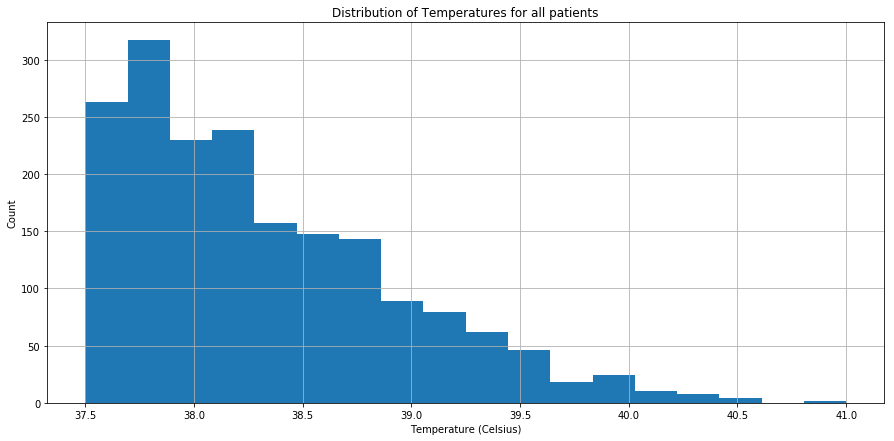

In [31]:
distr = data_selected[list(data_unique[data_unique.data_type=="num"].name)].dropna()
fig, ax = plt.subplots(figsize=(15,7))
ax.hist(distr["signv_temp_d0"], bins = distr.shape[0]//100)
ax.grid(True)
ax.set_ylabel("Count")
ax.set_xlabel("Temperature (Celsius)")
ax.set_title("Distribution of Temperatures for all patients")
plt.show()

In [55]:
distr = data_selected[list(data_unique[data_unique.data_type=="cat"].name)].dropna()
distr["dem_sex"] = distr["dem_sex"].apply(lambda x: 0 if x==1.0 else 1)
print(distr["dem_sex"])

3       0
5       1
6       1
7       1
10      0
12      1
13      0
17      0
21      0
27      0
28      1
29      0
32      0
35      1
36      0
40      0
44      0
45      0
50      0
51      1
52      0
53      1
57      1
62      0
64      0
68      1
74      0
75      1
76      1
78      1
       ..
3118    0
3120    1
3122    0
3124    1
3127    1
3128    1
3129    0
3132    1
3133    0
3134    0
3143    1
3146    0
3147    1
3149    0
3150    0
3155    1
3156    1
3157    1
3159    1
3161    1
3162    0
3174    0
3175    1
3177    0
3179    1
3181    1
3184    0
3186    0
3187    0
3191    1
Name: dem_sex, Length: 1434, dtype: int64


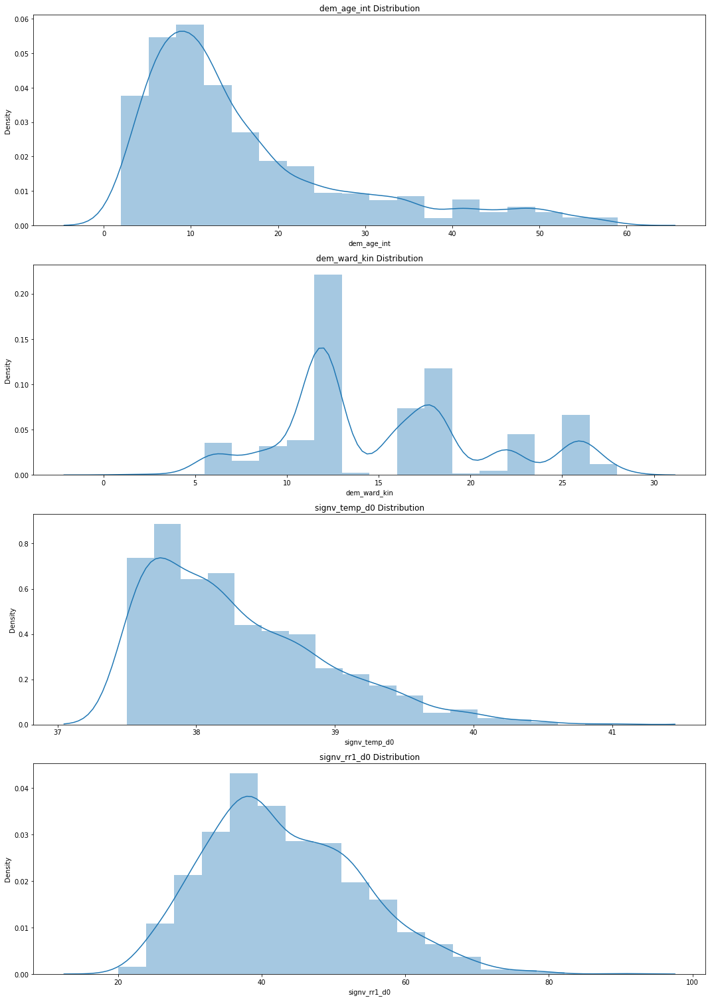

In [18]:
distr = data_selected[list(data_unique[data_unique.data_type=="num"].name)].dropna()
n = distr.shape[1]
fig, ax = plt.subplots(figsize=(15,7*n*0.75),nrows=n)
for idx, val in enumerate(list(distr.columns)):
    sns.distplot(distr[val], bins = distr.shape[0]//100, ax = ax[idx])
    ax[idx].set_title(label = val + " Distribution")
    ax[idx].set_ylabel("Density")
plt.tight_layout()

In [ ]:
distr.co

##### other type

We have some features that are categorical, and some categorical features are non-binary
--> one hot encoding and label-encoding.

In [145]:
data_selected.date_season_meteo.unique()

array([2, 1, 3], dtype=int64)

In [146]:
print("There are {} patients in the entire dataset".format(n_patients))

There are 3192 patients in the entire dataset


##### Missing values

We have a lot of missing values. We set a threshold of number of data points * 0.8 to remove any feature with missing values for more than (1-0.8)=0.2 of the patients.

Missing data-points can be imputed feature-wise, with various methods. However these methods are robust only if there are enough datapoints to evaluate what would be a good substitute for missing values. In our case, we substitute any missing value with the median of values for that column. Since we have removed any feature with "too many" missing values, the median should be a "good enough" intuitive imputation of missing data. However, it is not perfect, and more likely it is best to use intelligent imputation methods. Such methods notably allow data to be clustered in an unsupervised way, and imputation to be done on these clusters separately, so as to give a more tailored imputation per cluster.

We also need to remove any rows for which we don't know the value we want to predict: meaning that any patient with data `lab_malaria_any_d0` missing needs to be discarded from the dataset.

In [147]:
data_selected.shape

(3192, 27)

In [148]:
data_selected = data_selected[data_selected["lab_malaria_any_d0"].isnull()==False]

In [149]:
data_selected.shape

(3000, 27)

In [150]:
data_selected.dropna(axis=1,thresh=n_patients*0.8, inplace=True)
data_selected.fillna(data_selected.median(), inplace=True)

In [151]:
data_selected.isnull().any().any()

False

We have a very large class imbalance for the target label. We have 2680 negative cases for only 320 positive cases. This imbalance will impede the model from learning as efficiently as it can.

In [152]:
print(data_selected["lab_malaria_any_d0"].value_counts()[0]/data_selected["lab_malaria_any_d0"].value_counts()[1])

8.375


the ratio is not close to 1 at all.

In [153]:
data_selected["lab_malaria_any_d0"].value_counts()

0.0    2680
1.0     320
Name: lab_malaria_any_d0, dtype: int64

In [154]:
data_selected.columns

Index(['date_season_meteo', 'dem_age_int', 'dem_sex', 'dxlab_malaria_hi',
       'dxlab_malaria_low', 'dxlab_malaria_hsrdt', 'lab_malaria_any_d0',
       'sign_measles', 'sign_pallor', 'sign_skin_sev', 'sign_skininf',
       'signv_temp_d0', 'symp_abdopain', 'symp_bloodstool', 'symp_cough',
       'symp_diarrhea', 'symp_dyspnea', 'symp_eye', 'symp_feveronly',
       'symp_fev24h', 'symp_pharyngitis', 'symp_skin', 'symp_vomit',
       'signv_rr1_d0', 'days_of_fever'],
      dtype='object')

We will categorized the different features in order to be able to know what transformation to apply to which one.
We have kept some "confounding" features for now (`dxlab_malaria_hi/low`) in an effort to show how the following interpretation methods can help find these out. Confounding features affect both the independent variable we are trying to predict (`lab_malaria_any_d0`) and the other independent variables (`symp_cough`, `days_of_fever`, etc...).
In our case, the label we are trying to predict is the presence or absence of malaria, and the confounding features are results of a malaria test. If we use these features, we can relatively safely assume that the label we are trying to predict is no longer independent from our predictor variables.

In [155]:
# doing this manually to be sure but should not be

numerical = ["dem_age_int", "signv_temp_d0","days_of_fever","signv_rr1_d0"]
null_values = ["symp_liquidstool","dem_ward_kin"]
non_binary = ["date_season_meteo"]
confounding = ["dxlab_malaria_hi","dxlab_malaria_low", "dxlab_malaria_hsrdt"]
categorical = list(set(selected)-set(numerical)-set(null_values)-set(non_binary)-set(confounding))
all_categorical = categorical+["dry","rainy","post-rainy"]


categorical_confounded = list(set(selected)-set(numerical)-set(null_values)-set(non_binary))
all_categorical_confounded =  categorical_confounded+["date_season_meteo_1","date_season_meteo_2","date_season_meteo_3"]


Remember: the transformation methods discussed below are applied to columns SEPARATELY, indepedently from one another. The scaling or encoding of 1 feature column is NOT re-used for another column (it may be re-used in very specific cases).
#### categorical variables
we will now encode the variables that are categorical. This means that for a chosen column, its different values (which may be \["zero","one","two"\] as well as \["hot","rainy","cold","temperate"\]) will be mapped to integers: \[0,1,2\], etc...

##### one hot encoding
For categories that have more than 2 outcomes (non binary) we will then need to one-hot-encode them.
One-hot encoding switches a non binary column with (e.g.) 3 different values (\["hot","medium","cold"\]) to 3 binary columns, each representing the binary outcome of one of these 3 values: the 1st column represents the presence or absence of the value "hot"; the second column that of value "medium", and so on.

Therefore we will go from : 

Temperature: \["hot","medium","cold"\] 

to Temperature_value1: \[1, 0, 0\]; Temperature_value2: \[0, 1, 0\]; Temperature_value3: \[0, 0, 1\]

#### numerical variables
We will also normalise numerical variables so that their impact does not disproportionately affect the model weights. 
The standardization method we will use is a Min-Max scaler. For each feature column selected, the maximum and minimum values are found. Then each value undergoes the following mathematical transformation:

$\text{scaled value} = \frac{(\text{current value} - \text{minimum})}{(\text{maximum} - \text{minimum})}$

This transformation ensures 2 things:
1) the relative distance between values is conserved, as the dividing factor (denominator) is the same for all values.
2) that all values are contained within 0 and 1: the minimum value is set to zero, while the maximum value is set to 1. This means that there is unit-variance.

##### Min max scaling

In [21]:
from sklearn.preprocessing import MinMaxScaler

In [22]:
le = LabelEncoder()
mms = MinMaxScaler()


data_numerical = pd.DataFrame(mms.fit_transform(data_selected[numerical]), columns=numerical)
data_ml = data_selected[categorical]
data_ml = data_ml.apply(le.fit_transform)
data_ml = pd.get_dummies(data_selected["date_season_meteo"], 
                         prefix="season")\
                        .merge(data_ml,
                               left_index=True,
                               right_index=True)\
                        .merge(data_numerical,
                               left_index=True,
                               right_index=True)\
                        .rename({"season_1":"dry",
                                "season_2":"rainy",
                                "season_3":"post-rainy"},
                               axis=1)

we will also create a "wrong" dataset, containing confounding factors:
    

In [23]:
le = LabelEncoder()
mms = MinMaxScaler()


data_numerical = pd.DataFrame(mms.fit_transform(data_selected[numerical]), columns = numerical)
data_ml_confounded = data_selected[categorical_confounded]
data_ml_confounded = data_ml_confounded.apply(le.fit_transform)
data_ml_confounded = pd.get_dummies(data_selected["date_season_meteo"], 
                                    prefix="season")\
                                    .merge(data_ml_confounded, 
                                           left_index=True, 
                                           right_index=True)\
                                    .merge(data_numerical, 
                                           left_index=True, 
                                           right_index=True)\
                                    .rename({"season_1":"dry",
                                            "season_2":"rainy",
                                            "season_3":"post-rainy"},
                                            axis=1)

Here we separate the data between label (y) and features (X)

In [24]:
y_label= ["lab_malaria_any_d0"]

X_labels = list(set(data_ml.columns)-set(y_label))
X_labels_confounded = list(set(data_ml_confounded.columns)-set(y_label))


X = data_ml[X_labels]
y = data_ml[y_label]


X_c = data_ml_confounded[X_labels_confounded]

we will quickly take a look at the way the datapoints are distributed after application of a PCA to reduce the number of dimension to 2. This operation can help detect anomalies in the dataset which would be hard to solve for a mathematical model. It can also show differences within the dataset right away.

In [25]:
from sklearn.decomposition import PCA

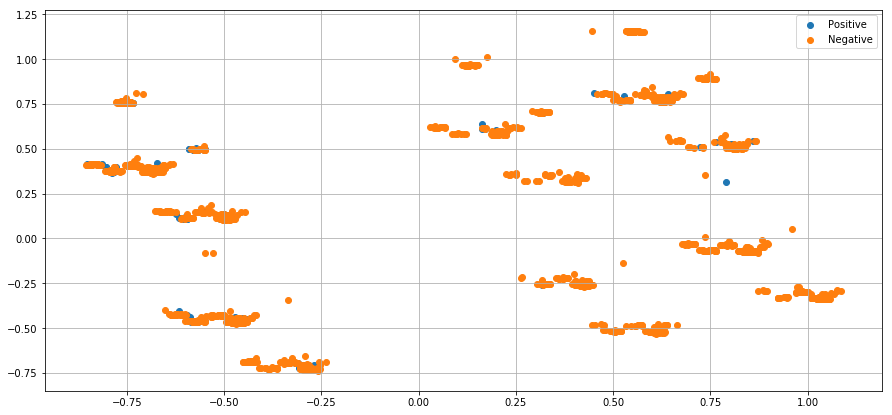

In [26]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X)


fig, ax = plt.subplots(figsize=(15,7))


ax.scatter(X_pca[np.ravel(y)==1,0],X_pca[np.ravel(y)==1,1], label="Positive")
ax.scatter(X_pca[np.ravel(y)==0,0],X_pca[np.ravel(y)==0,1], label = "Negative")

plt.legend()

plt.grid()

X_pca = pd.DataFrame(X_pca, columns=["Pca1","Pca2"])


Here we plotted a PCA on all data instances (so all data points with all selected features - but not the prediction label we are trying to find) and color-coded them based on the prediction label.
In ML jargon: we plotted X values and color-coded them with the y label.

We can also see that there is a strong class imbalance, as previously stated.

We can see that there is no "obvious" division into two groups that seems to be correctly done through PCA dimension reduction. This means that using a classification algorithm will be necessary (instead of basic unsupervised dimension reduction grouping technique).
 
We will compare results of using PCA reduced data against normal data and see if there is a difference in accuracy.

##### Class imbalance

_note_: we are talking about "label" imbalance only.

since the two classes are severely imbalanced, we will use sampling to balance them out.
We can use under sampling, and reduce the number of data points from the larger class; or use over sampling and increase the number of data points from the smaller class. Since our dataset is pretty small, we will use over-sampling so as to not reduce the overall number of data points. 

There are various re-sampling techniques, the most straight-forward one being random sampling.
For over sampling, we will use a random over-sampling technique: we randomly select a data point from the available data points (within the "smaller" class), and add it as a new sample to the overall dataset. This means that there will be duplicate data points. We do this over and over again (sampling with replacement) until we reach the desired number of data points for our smaller class (e.g. the same number of data points as the bigger class). This technique obviously has some drawbacks, the first of which is that duplicating data points biases the way the model works. To reduce this effect, we can reduce the number of over-sampled data points which means that we will not have the same number of data points for both classes, but we still made them more equal.

There are various other sampling techniques, including some that allow us to introduce noise / perturbations in the newly added data points (so that it becomes highly unlikely that there are duplicate data points), and others which combine both under and over sampling. Some techniques are based on reducing the data points to a low-dimensional space, and then removing those datapoints which are close in this new dimension space but which have different labels (which amounts to trying to reduce the complexity of the classification task of the ML model). Each sampling techniques has advantages and drawbacks, and it is important to understand exactly what these are in order to be able to explain any abnormal behavior in our machine learning model.

here we are choosing to oversample and obtain a ratio of minority/majority class of 0.3

In [27]:
from imblearn.over_sampling import RandomOverSampler

In [28]:
ros = RandomOverSampler(random_state=0, sampling_strategy=0.3)
X_ros, y_ros = ros.fit_sample(X, y["lab_malaria_any_d0"])


ros = RandomOverSampler(random_state=0, sampling_strategy=0.3)
X_ros_c, y_ros_c = ros.fit_sample(X_c, y["lab_malaria_any_d0"])

ros = RandomOverSampler(random_state=0, sampling_strategy=0.3)
X_ros_pca, y_ros_pca = ros.fit_sample(X_pca, y["lab_malaria_any_d0"])

In [29]:
X_ros=pd.DataFrame(X_ros, columns=X.columns)
y_ros=pd.DataFrame(y_ros,columns=["lab_malaria_any_d0"])

X_ros_c=pd.DataFrame(X_ros_c, columns=X_c.columns)


X_ros_pca=pd.DataFrame(X_ros_pca, columns=X_pca.columns)


for over sampling under sampling techniques


https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets

https://imbalanced-learn.readthedocs.io/en/stable/auto_examples/applications/plot_over_sampling_benchmark_lfw.html


#### train test split
We will now split our dataset, both features and associated labels, into two: a training set and a testing set. The split is done randomly, and 30% of the original dataset will be used in the testing set while the remaining dataset will be used in the training set. 

The training set is used to "train" the model, which means give it data so it can learn potential associations between data points' features and their labels. 

The testing set is left alone until is it needed for the "testing" of the already trained model. The testing set should never be used for anything training-related. If it were used in the training phase, when we test the model, it would probably over-perform as it would be tested on data points it had already seen (data points that had affected its internal state). 

We can further divide the training set into two: a training set (again) and a validaton set. The validation set is used for cross-validation and hyper-parameter tuning.

In [30]:
train_X, val_X, train_y, val_y = train_test_split(X_ros, y_ros, random_state=1)

train_X_c, val_X_c, train_y_c, val_y_c = train_test_split(X_ros_c, y_ros, random_state=1)

train_X_pca, val_X_pca, train_y_pca, val_y_pca = train_test_split(X_ros_pca, y_ros, random_state=1)

Here the task is a classification one.
The Model we will use is a random forest classifier.

In [31]:
model_forest = RandomForestClassifier(n_estimators=100, random_state=0).fit(train_X, np.ravel(train_y))

model_forest_c = RandomForestClassifier(n_estimators=100, random_state=0).fit(train_X_c, np.ravel(train_y_c))

model_forest_pca = RandomForestClassifier(n_estimators=100, random_state=0).fit(train_X_pca, np.ravel(train_y_pca))

In [32]:
print(train_X.shape, val_X.shape)

(2445, 23) (815, 23)


In our case, the training set has size:2445 and the testing set has size:815

# Results

## Metrics
### Basic metrics: accuracy, recall, precision
We will print out some basic results from the models

#### Choosing input data

In [33]:
validation_data = [val_X, val_X_c, val_X_pca]
validation_label = [val_y, val_y_c, val_y_pca]
models = [model_forest, model_forest_c, model_forest_pca]
names = ["Random forest: simple","Random forest: with confounding factors","Random forest: with pca data"]

for idx, val in enumerate(models):
    model_preds = val.predict(validation_data[idx])
    accuracy = metrics.accuracy_score(model_preds,validation_label[idx])
    precision = metrics.precision_score(model_preds,validation_label[idx])
    recall = metrics.recall_score(model_preds,validation_label[idx])
    print("{} \naccuracy {} \nprecision {} \nrecall {}\n\n".format(names[idx],accuracy, precision, recall))

Random forest: simple 
accuracy 0.9423312883435583 
precision 0.8421052631578947 
recall 0.8780487804878049


Random forest: with confounding factors 
accuracy 1.0 
precision 1.0 
recall 1.0


Random forest: with pca data 
accuracy 0.9067484662576687 
precision 0.8245614035087719 
recall 0.7540106951871658




**to do** might want to include TRAINING accuracy as well... maybe do a train test iteration for cross val plot?

Now we will only take a look at the "simple data", since we can see there is an obvious problem with the "confounding factors" and since the pca data does not yield better overall results.

#### Choosing a model:
Let's take a look at different models:

info is from sklearn

##### ridge regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
we want the ridge classifier though, which is very similar
The Ridge regressor has a classifier variant: RidgeClassifier. This classifier first converts binary targets to {-1, 1} and then treats the problem as a regression task, optimizing the same objective as above. The predicted class corresponds to the sign of the regressor’s prediction. For multiclass classification, the problem is treated as multi-output regression, and the predicted class corresponds to the output with the highest value.
It might seem questionable to use a (penalized) Least Squares loss to fit a classification model instead of the more traditional logistic or hinge losses. However in practice all those models can lead to similar cross-validation scores in terms of accuracy or precision/recall, while the penalized least squares loss used by the RidgeClassifier allows for a very different choice of the numerical solvers with distinct computational performance profiles.

In [219]:
from sklearn.linear_model import RidgeClassifier, RidgeCV, LogisticRegression
# should optimize alpha parameter really using CV
ridge_model = RidgeClassifier().fit(train_X, np.ravel(train_y))
ridge_model.score(val_X, val_y)

0.7889570552147239

##### logistic regression
Logistic regression, despite its name, is a linear model for classification rather than regression. Logistic regression is also known in the literature as logit regression, maximum-entropy classification (MaxEnt) or the log-linear classifier. In this model, the probabilities describing the possible outcomes of a single trial are modeled using a logistic function.



In [218]:
logreg_model = LogisticRegression(random_state=0).fit(train_X, np.ravel(train_y))
logreg_model.score(val_X, val_y)

0.7840490797546013

##### SVM
Effective in high dimensional spaces.

Still effective in cases where number of dimensions is greater than the number of samples.

Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.

Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.

The disadvantages of support vector machines include:

If the number of features is much greater than the number of samples, avoid over-fitting in choosing Kernel functions and regularization term is crucial.

SVMs do not directly provide probability estimates, these are calculated using an expensive five-fold cross-validation (see Scores and probabilities, below).



In [217]:
from sklearn import svm
svm_model=svm.SVC().fit(train_X, np.ravel(train_y))
svm_model.score(val_X, val_y)

0.803680981595092

##### KNN
Neighbors-based classification is a type of instance-based learning or non-generalizing learning: it does not attempt to construct a general internal model, but simply stores instances of the training data. Classification is computed from a simple majority vote of the nearest neighbors of each point: a query point is assigned the data class which has the most representatives within the nearest neighbors of the point.

scikit-learn implements two different nearest neighbors classifiers: KNeighborsClassifier implements learning based on the  nearest neighbors of each query point, where  is an integer value specified by the user. RadiusNeighborsClassifier implements learning based on the number of neighbors within a fixed radius  of each training point, where  is a floating-point value specified by the user.

The -neighbors classification in KNeighborsClassifier is the most commonly used technique. The optimal choice of the value  is highly data-dependent: in general a larger  suppresses the effects of noise, but makes the classification boundaries less distinct.

In cases where the data is not uniformly sampled, radius-based neighbors classification in RadiusNeighborsClassifier can be a better choice. The user specifies a fixed radius , such that points in sparser neighborhoods use fewer nearest neighbors for the classification. For high-dimensional parameter spaces, this method becomes less effective due to the so-called “curse of dimensionality”.

The basic nearest neighbors classification uses uniform weights: that is, the value assigned to a query point is computed from a simple majority vote of the nearest neighbors. Under some circumstances, it is better to weight the neighbors such that nearer neighbors contribute more to the fit. This can be accomplished through the weights keyword. The default value, weights = 'uniform', assigns uniform weights to each neighbor. weights = 'distance' assigns weights proportional to the inverse of the distance from the query point. Alternatively, a user-defined function of the distance can be supplied to compute the weights.

In [216]:
from sklearn.neighbors import KNeighborsClassifier
knnc_model = KNeighborsClassifier(n_neighbors=3).fit(train_X, np.ravel(train_y))
knnc_model.score(val_X, val_y)

0.8085889570552147

##### Bernouilli NB
BernoulliNB implements the naive Bayes training and classification algorithms for data that is distributed according to multivariate Bernoulli distributions; i.e., there may be multiple features but each one is assumed to be a binary-valued (Bernoulli, boolean) variable. Therefore, this class requires samples to be represented as binary-valued feature vectors; if handed any other kind of data, a BernoulliNB instance may binarize its input (depending on the binarize parameter).

The decision rule for Bernoulli naive Bayes is based on

which differs from multinomial NB’s rule in that it explicitly penalizes the non-occurrence of a feature  that is an indicator for class , where the multinomial variant would simply ignore a non-occurring feature.

In the case of text classification, word occurrence vectors (rather than word count vectors) may be used to train and use this classifier. BernoulliNB might perform better on some datasets, especially those with shorter documents. It is advisable to evaluate both models, if time permits.

In [222]:
from sklearn.naive_bayes import BernoulliNB
bnb_model = BernoulliNB().fit(train_X, np.ravel(train_y))
bnb_model.score(val_X, val_y)

0.7705521472392638

##### Decision trees
Decision Trees (DTs) are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

Some advantages of decision trees are:

Simple to understand and to interpret. Trees can be visualised.

Requires little data preparation. Other techniques often require data normalisation, dummy variables need to be created and blank values to be removed. Note however that this module does not support missing values.

The cost of using the tree (i.e., predicting data) is logarithmic in the number of data points used to train the tree.

Able to handle both numerical and categorical data. Other techniques are usually specialised in analysing datasets that have only one type of variable. See algorithms for more information.

Able to handle multi-output problems.

Uses a white box model. If a given situation is observable in a model, the explanation for the condition is easily explained by boolean logic. By contrast, in a black box model (e.g., in an artificial neural network), results may be more difficult to interpret.

Possible to validate a model using statistical tests. That makes it possible to account for the reliability of the model.

Performs well even if its assumptions are somewhat violated by the true model from which the data were generated.

The disadvantages of decision trees include:

Decision-tree learners can create over-complex trees that do not generalise the data well. This is called overfitting. Mechanisms such as pruning, setting the minimum number of samples required at a leaf node or setting the maximum depth of the tree are necessary to avoid this problem.

Decision trees can be unstable because small variations in the data might result in a completely different tree being generated. This problem is mitigated by using decision trees within an ensemble.

The problem of learning an optimal decision tree is known to be NP-complete under several aspects of optimality and even for simple concepts. Consequently, practical decision-tree learning algorithms are based on heuristic algorithms such as the greedy algorithm where locally optimal decisions are made at each node. Such algorithms cannot guarantee to return the globally optimal decision tree. This can be mitigated by training multiple trees in an ensemble learner, where the features and samples are randomly sampled with replacement.

There are concepts that are hard to learn because decision trees do not express them easily, such as XOR, parity or multiplexer problems.

Decision tree learners create biased trees if some classes dominate. It is therefore recommended to balance the dataset prior to fitting with the decision tree.


In [223]:
from sklearn import tree
tree_model = tree.DecisionTreeClassifier().fit(train_X, train_y)
tree_model.score(val_X, val_y)

0.8478527607361963

##### RANDOM FOREST

- The next model Random Forests is one of the most popular. Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees (n_estimators=100) at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. Reference Wikipedia.

In [225]:
model_forest = RandomForestClassifier().fit(train_X, np.ravel(train_y))
model_forest.score(val_X, val_y)

0.9460122699386503

This is by far the best result so we will take a closer look at this model.

##### NN - multi layer perceptron for classification
Multi-layer Perceptron (MLP) is a supervised learning algorithm that learns a function 
 by training on a dataset, where  is the number of dimensions for input and  is the number of dimensions for output. Given a set of features 
 and a target , it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. Figure 1 shows a one hidden layer MLP with scalar output.
 
MLP trains using Backpropagation. More precisely, it trains using some form of gradient descent and the gradients are calculated using Backpropagation. For classification, it minimizes the Cross-Entropy loss function, giving a vector of probability estimates  per sample :



In [232]:
from sklearn.neural_network import MLPClassifier
mlpc_model = MLPClassifier(solver='adam',
                           alpha=1e-5,
                           hidden_layer_sizes=(5, 2),
                           max_iter=500,
                           random_state=1).fit(train_X, np.ravel(train_y))
mlpc_model.score(val_X, val_y)


0.7938650306748466

### confusion matrix

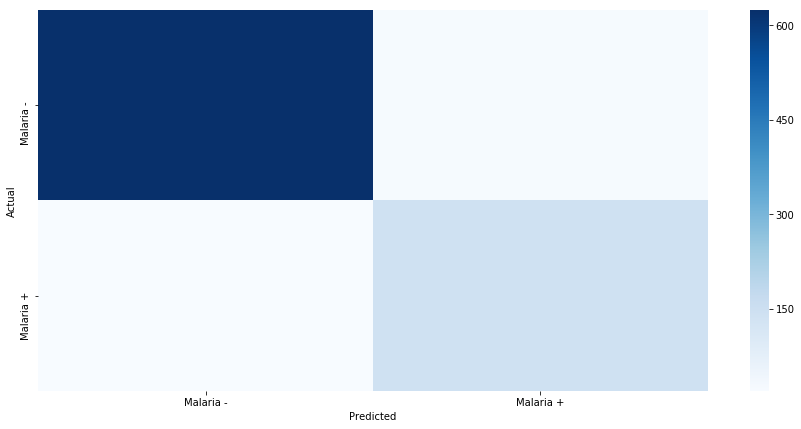

In [34]:
model_forest_preds = model_forest.predict(val_X)

confusion_matrix = metrics.confusion_matrix(model_forest_preds, val_y)

confusion_matrix_plot = pd.DataFrame(confusion_matrix, 
                                    columns=["Malaria -","Malaria +"],
                                    index =["Malaria -", "Malaria +"])
fig,ax=plt.subplots(figsize=(15,7))
confusion_matrix_plot.index.name = 'Actual'
confusion_matrix_plot.columns.name = 'Predicted'
sns.heatmap(confusion_matrix_plot, cmap="Blues",ax=ax)


### ROC curve; specificity and sensitivity curves

In [35]:
def get_preds(threshold, probabilities):
    return [1 if prob > threshold else 0 for prob in probabilities]

In [36]:
# https://medium.com/@kunanba/what-is-roc-auc-and-how-to-visualize-it-in-python-f35708206663
# only select [:,1] == probabilities for the positive class ONLY

tn, fp, fn, tp = np.ravel(confusion_matrix)
probas = model_forest.predict_proba(val_X)[:, 1]

roc_values = []
specificities, sensitivities = [],[]
joudens = []
for thresh in np.linspace(0, 1, 100):
    preds = get_preds(thresh, probas)
    tn, fp, fn, tp = np.ravel(metrics.confusion_matrix(val_y, preds))
    tpr = tp/(tp+fn) #recall/sensitivity
    fpr = fp/(fp+tn)
    specificity = tn/(tn+fp) *100
    sensitivity = tp/(tp+fn) *100
     
    roc_values.append([tpr, fpr])
    specificities.append(specificity)
    sensitivities.append(sensitivity)

    tpr_values, fpr_values = zip(*roc_values)
    joudens.append((specificity  + sensitivity - 100)/100)

    
auroc_score = metrics.roc_auc_score(val_y, model_forest_preds)




In [37]:
thr_sim = 1
sens_spec_max = [(idx, np.abs(vals[0]-vals[1])) for (idx,vals) in enumerate(zip(specificities,sensitivities)) if (np.abs(vals[0]-vals[1])<thr_sim)]
valmin = np.min([sens_spec_max[i][1] for i in range(len(sens_spec_max))])
argmin = sens_spec_max[sens_spec_max==min][0]
thr_argmin = argmin/100


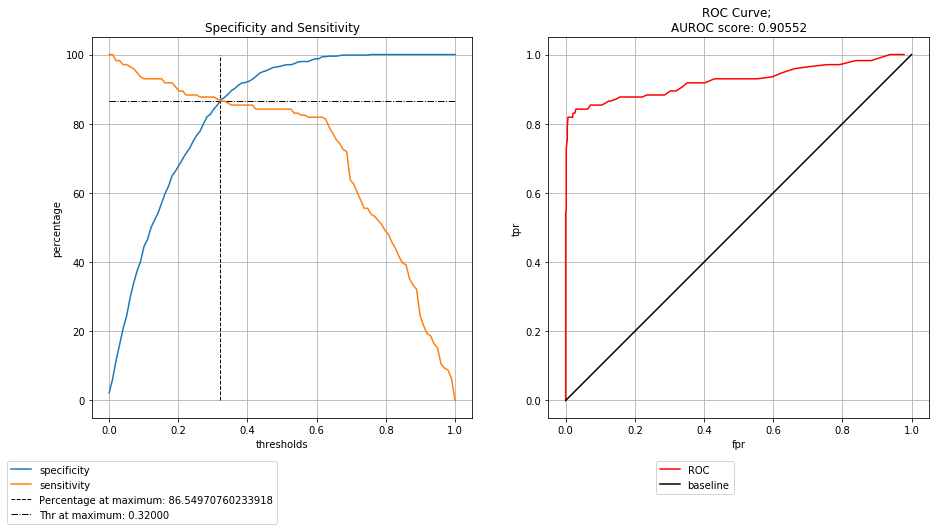

In [38]:
fig, ax = plt.subplots(figsize=(15,7), ncols=2)
ax[0].grid(True)

ax[0].plot(np.linspace(0, 1, 100),specificities, label="specificity")
ax[0].plot(np.linspace(0, 1, 100),sensitivities, label ="sensitivity")
ax[0].vlines(thr_argmin,
           ymin=0,
           ymax=100,
           color="k",
           linewidth=1.0,
           linestyle="--",
           label="Percentage at maximum: {}".format(sensitivities[argmin]))
ax[0].hlines(sensitivities[argmin],
           xmin=0,
           xmax=1.0,
           color="k",
           linewidth=1.0,
           linestyle="-.",
           label="Thr at maximum: {:.5f}".format(thr_argmin))

ax[0].set_xlabel("thresholds")
ax[0].set_ylabel("percentage")
ax[0].legend(bbox_to_anchor=(0.5, -0.1))
ax[0].set_title("Specificity and Sensitivity")


ax[1].grid(True)
ax[1].plot(fpr_values, tpr_values, label="ROC", color = "red")
ax[1].plot(np.linspace(0,1,100),np.linspace(0,1,100),label="baseline", color="black")
ax[1].set_xlabel("fpr")
ax[1].set_ylabel("tpr")
ax[1].legend(bbox_to_anchor=(0.5,-0.1))
ax[1].set_title("ROC Curve; \nAUROC score: {:.5f}".format(auroc_score))



plt.show()

Jouden = specificity  + sensitivity - 1

The area under the curve, AUC, is an indicator of the overall ROC curve performance.

### Odds ratio and Risk Ratio

intro : https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4640017/#:~:text=The%20relative%20risk%20(also%20known,event%20in%20the%20other%20group.
 
 The relative risk (also known as risk ratio [RR]) is the ratio of risk of an event in one group (e.g., exposed group) versus the risk of the event in the other group (e.g., nonexposed group). The odds ratio (OR) is the ratio of odds of an event in one group versus the odds of the event in the other group.

forest ratio: https://www.google.com/search?rlz=1C1CHBD_enCH818CH818&ei=C4OuX96OHoOQlwS1n5fgBQ&q=odds+ratio+on+forest+model+python&oq=odds+ratio+on+forest+model+python&gs_lcp=CgZwc3ktYWIQAzoHCAAQRxCwA1CdDVjfEGC9EWgBcAB4AYABiAGIAZ4FkgEDNS4ymAEAoAEBqgEHZ3dzLXdpesgBCMABAQ&sclient=psy-ab&ved=0ahUKEwiewNi4yf_sAhUDyIUKHbXPBVwQ4dUDCA0&uact=5

**TO DO** below: should we do tests with the training or with the testing data?.............. 

## Feature Interpretation

### Feature importance evaluation: based on features as a whole


#### Partial dependence plot
These 1-dimension partial dependence plots allow us to explore the relationship between the prediction and some features, taken individually. On the left most plot below, we can distinguish a line, which seems to indicate a linear relationship between the `dem_age_int` feature and the model output.

Below: values have been normalized so they are between 0 and 1 (x-axis).

However, this kind of plot does not take into consideration feature co-dependences: a feature might impact the output differently if another feature is set to a different value. An example of this: if we take the `signv_temp_d0` feature, and consider the `dem_age_int` feature, when we look at this second feature separately we see the linear relationship below. However, think about how age and fever might be related... 


Partial dependence plots (PDP) show the dependence between the target response 1 and a set of ‘target’ features, marginalizing over the values of all other features (the ‘complement’ features). Intuitively, we can interpret the partial dependence as the expected target response as a function of the ‘target’ features.



In [39]:
from sklearn.inspection import plot_partial_dependence

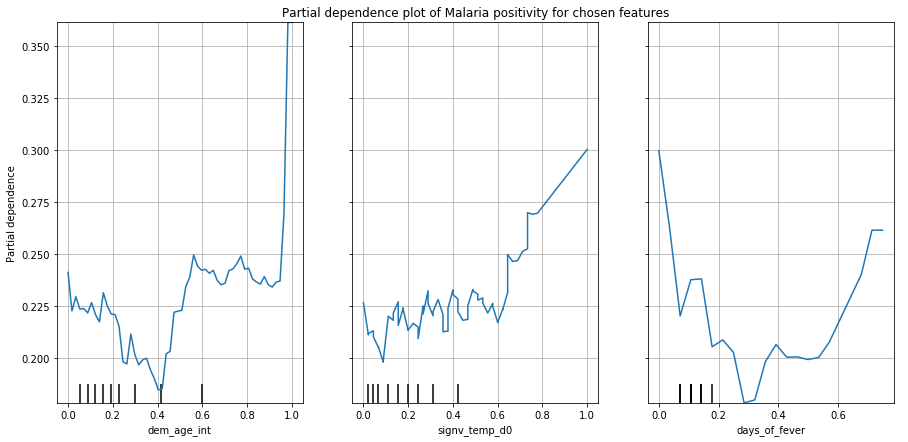

In [40]:
plt.rcParams['axes.grid'] = True

fig, ax = plt.subplots(figsize=(15,7))
plot_partial_dependence(model_forest, train_X,features=["dem_age_int","signv_temp_d0","days_of_fever"],ax=ax) 
ax.set_title("Partial dependence plot of Malaria positivity for chosen features")

plt.show()

We can see that for very high values of age, there is a strong dependence to the malaria-positivity. For the temperature, the dependence seems to indicate a linear correlation, with higher temperatures increasing the dependence to malaria positivity. For the number of days with fever, it is hard to draw any conclusion from this plot.

#### Feature selection using statistical tests

**BIVARIATE analysis**

In [41]:
from sklearn.feature_selection import mutual_info_classif,chi2,f_classif, SelectKBest

##### Using the mutual info classif test:

Estimate mutual information for a discrete target variable.


Mutual information (MI) [1] between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

The function relies on nonparametric methods based on entropy estimation from k-nearest neighbors distances as described in [2] and [3]. Both methods are based on the idea originally proposed in [4].

In probability theory and information theory, the mutual information (MI) of two random variables is a measure of the mutual dependence between the two variables. More specifically, it quantifies the "amount of information" (in units such as shannons, commonly called bits) obtained about one random variable through observing the other random variable. The concept of mutual information is intimately linked to that of entropy of a random variable, a fundamental notion in information theory that quantifies the expected "amount of information" held in a random variable.

Not limited to real-valued random variables and linear dependence like the correlation coefficient, MI is more general and determines how different the joint distribution of the pair {\displaystyle (X,Y)}(X,Y) is to the product of the marginal distributions of {\displaystyle X}X and {\displaystyle Y}Y. MI is the expected value of the pointwise mutual information (PMI).

**SHOULD SPECIFY DISCRETE FEATURES VS CONTINUOUS**

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


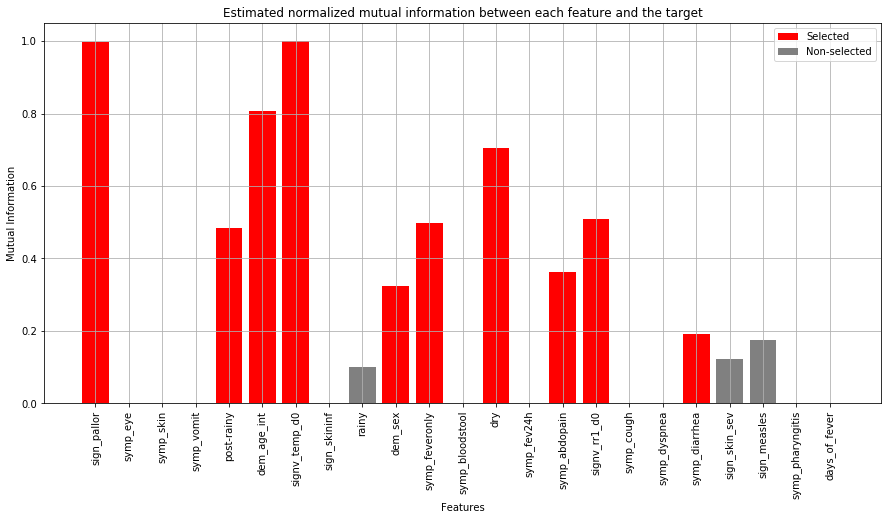

In [42]:
k=10
selector_mi = SelectKBest(mutual_info_classif, k=k)
selector_mi.fit(train_X,train_y)
scores = selector_mi.scores_
scores/=scores.max()

colors={"Selected":"red","Non-selected":"grey"}

fig, ax = plt.subplots(figsize=(15,7), ncols=1)
ax.bar(np.arange(train_X.shape[-1]-0.45)[selector_mi.get_support()],
          scores[selector_mi.get_support()].ravel(),
          label="Selected",
          color=colors["Selected"]
)
ax.bar(np.arange(train_X.shape[-1]-0.45)[~selector_mi.get_support()],
          scores[~selector_mi.get_support()].ravel(),
          label="Non-selected",
          color=colors["Non-selected"]
)
ax.set_title("Estimated normalized mutual information between each feature and the target")
ax.set_xlabel("Features")
ax.xaxis.set_tick_params(rotation=90)
ax.set_xticks(np.arange(train_X.shape[-1]))
ax.set_xticklabels([x for x in train_X.columns])
ax.set_ylabel("Mutual Information")
ax.legend()


plt.show()

##### Using the Chi-2 test:

Compute chi-squared stats between each non-negative feature and class.

This score can be used to select the n_features features with the highest values for the test chi-squared statistic from X, which must contain only non-negative features such as booleans or frequencies (e.g., term counts in document classification), relative to the classes.

Recall that the chi-square test measures dependence between stochastic variables, so using this function “weeds out” the features that are the most likely to be independent of class and therefore irrelevant for classification.

returns

chi2array, shape = (n_features,)
chi2 statistics of each feature.

pvalarray, shape = (n_features,)
p-values of each feature.

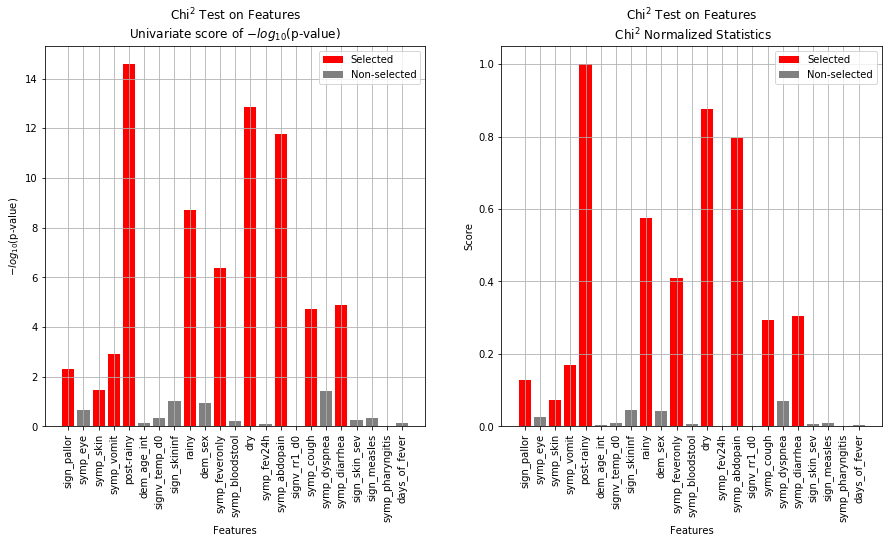

In [43]:
k=10
selector_chi2 = SelectKBest(chi2, k=k)
selector_chi2.fit(train_X,train_y)
scores = selector_chi2.scores_
scores/=scores.max()
pvalues = selector_chi2.pvalues_
pvalues/=pvalues.max()
pvalueslog10 = -np.log10(pvalues)

colors={"Selected":"red","Non-selected":"grey"}

fig, ax = plt.subplots(figsize=(15,7), ncols=2)
ax[0].bar(np.arange(train_X.shape[-1]-0.45)[selector_chi2.get_support()],
          pvalueslog10[selector_chi2.get_support()].ravel(),
          label="Selected",
          color=colors["Selected"]
)
ax[0].bar(np.arange(train_X.shape[-1]-0.45)[~selector_chi2.get_support()],
          pvalueslog10[~selector_chi2.get_support()].ravel(),
          label="Non-selected",
          color=colors["Non-selected"]
)
ax[0].set_title("Chi$^{2}$ Test on Features\nUnivariate score of $-log_{10}$(p-value)")
ax[0].set_xlabel("Features")
ax[0].xaxis.set_tick_params(rotation=90)
ax[0].set_xticks(np.arange(train_X.shape[-1]))
ax[0].set_xticklabels([x for x in train_X.columns])
ax[0].set_ylabel("$-log_{10}$(p-value)")
ax[0].legend()

ax[1].bar(np.arange(train_X.shape[-1]-0.45)[selector_chi2.get_support()],
          scores[selector_chi2.get_support()].ravel(),
          label="Selected",
          color=colors["Selected"]
)
ax[1].bar(np.arange(train_X.shape[-1]-0.45)[~selector_chi2.get_support()],
          scores[~selector_chi2.get_support()].ravel(),
          label="Non-selected",
          color=colors["Non-selected"]
)
ax[1].set_title("Chi$^{2}$ Test on Features\n Chi$^{2}$ Normalized Statistics")
ax[1].set_xlabel("Features")
ax[1].xaxis.set_tick_params(rotation=90)
ax[1].set_xticks(np.arange(train_X.shape[-1]))
ax[1].set_xticklabels([x for x in train_X.columns])
ax[1].set_ylabel("Score")
ax[1].legend()

plt.show()


##### Using the f-Classif test:

Compute the ANOVA F-value for the provided sample.

returns 

Farray, shape = [n_features,]
The set of F values.

pvalarray, shape = [n_features,]
The set of p-values.

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


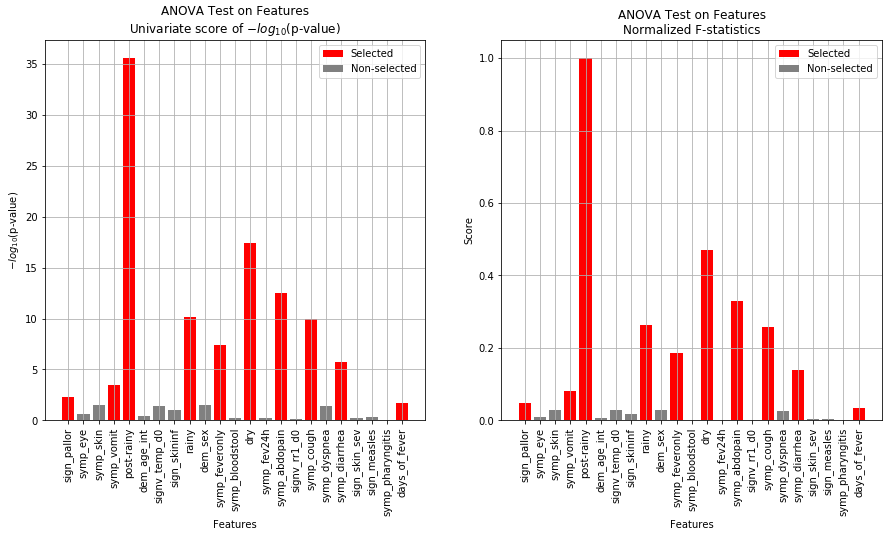

In [44]:
k=10
selector_anova = SelectKBest(f_classif, k=k)
selector_anova.fit(train_X,train_y)
scores = selector_anova.scores_
scores/=scores.max()
pvalues = selector_anova.pvalues_
pvalues/=pvalues.max()
pvalueslog10 = -np.log10(pvalues)

colors={"Selected":"red","Non-selected":"grey"}

fig, ax = plt.subplots(figsize=(15,7), ncols=2)
ax[0].bar(np.arange(train_X.shape[-1]-0.45)[selector_anova.get_support()],
          pvalueslog10[selector_anova.get_support()].ravel(),
          label="Selected",
          color=colors["Selected"]
)
ax[0].bar(np.arange(train_X.shape[-1]-0.45)[~selector_anova.get_support()],
          pvalueslog10[~selector_anova.get_support()].ravel(),
          label="Non-selected",
          color=colors["Non-selected"]
)

ax[0].set_title("ANOVA Test on Features\nUnivariate score of $-log_{10}$(p-value)")
ax[0].set_xlabel("Features")
ax[0].xaxis.set_tick_params(rotation=90)
ax[0].set_xticks(np.arange(train_X.shape[-1]))
ax[0].set_xticklabels([x for x in train_X.columns])
ax[0].set_ylabel("$-log_{10}$(p-value)")
ax[0].legend()

ax[1].bar(np.arange(train_X.shape[-1]-0.45)[selector_anova.get_support()],
          scores[selector_anova.get_support()].ravel(),
          label="Selected",
          color=colors["Selected"]
)
ax[1].bar(np.arange(train_X.shape[-1]-0.45)[~selector_anova.get_support()],
          scores[~selector_anova.get_support()].ravel(),
          label="Non-selected",
          color=colors["Non-selected"]
)
ax[1].set_title("ANOVA Test on Features\nNormalized F-statistics")
ax[1].set_xlabel("Features")
ax[1].xaxis.set_tick_params(rotation=90)
ax[1].set_xticks(np.arange(train_X.shape[-1]))
ax[1].set_xticklabels([x for x in train_X.columns])
ax[1].set_ylabel("Score")
ax[1].legend()

plt.show()


Here are the features that all methods agreed were important

In [45]:
selected_features =pd.DataFrame(np.column_stack((train_X.columns,selector_mi.get_support(),selector_chi2.get_support(),selector_anova.get_support())),
             columns=["features","mi","chi2","anova"])
selected_features[(selected_features.mi==True)&(selected_features.chi2==True)&(selected_features.anova==True)]

,features,mi,chi2,anova
0,sign_pallor,True,True,True
4,post-rainy,True,True,True
10,symp_feveronly,True,True,True
12,dry,True,True,True
14,symp_abdopain,True,True,True
18,symp_diarrhea,True,True,True


Here are the features that all methods agreed were not as important

In [46]:
selected_features =pd.DataFrame(np.column_stack((train_X.columns,selector_mi.get_support(),selector_chi2.get_support(),selector_anova.get_support())),
             columns=["features","mi","chi2","anova"])
selected_features[(selected_features.mi==False)&(selected_features.chi2==False)&(selected_features.anova==False)]

,features,mi,chi2,anova
1,symp_eye,False,False,False
7,sign_skininf,False,False,False
11,symp_bloodstool,False,False,False
13,symp_fev24h,False,False,False
17,symp_dyspnea,False,False,False
19,sign_skin_sev,False,False,False
20,sign_measles,False,False,False
21,symp_pharyngitis,False,False,False


This analysis is only bivariate.... so not very helpful. We can actually see that in the "not selected" features, models consistently show that `signv_rr1_d0` is unimportant when we could have an intuition that it is important (from a medical standpoint)...

We could rather take a look at feature elimination algorithms: like recursive feature elimination.

#### Recursive Feature Elimination Selection

Given an external estimator that assigns weights to features (e.g., the coefficients of a linear model), the goal of recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. First, the estimator is trained on the initial set of features and the importance of each feature is obtained either through a coef_ attribute or through a feature_importances_ attribute. Then, the least important features are pruned from current set of features. That procedure is recursively repeated on the pruned set until the desired number of features to select is eventually reached.

In [47]:
from sklearn.feature_selection import RFE

In [48]:
rfe = RFE(estimator=model_forest, step=1)
rfe_scores=[]
rfe.fit(train_X, np.ravel(train_y))
rfe_selected = [x for x in val_X[val_X.columns[rfe.support_]].columns]
rfe_selected

['symp_vomit',
 'post-rainy',
 'dem_age_int',
 'signv_temp_d0',
 'dem_sex',
 'symp_fev24h',
 'symp_abdopain',
 'signv_rr1_d0',
 'symp_cough',
 'symp_diarrhea',
 'days_of_fever']

This method is usually a good method to use for feature selection. At each step, the model performance is tested "against itself". 

Note: Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.



#### Multivariate vs. Bivariate analysis of Features: 
We will only use the Chi-2 test here.
We will compare the Chi-2 results ot multivariate analyses: notably the impurity based importance contained in the random forest model's sklearn implementation, and to a permutation importance score.

Why use permutation importance instead of just feature importance? 
- impurity-based feature importance can inflate the importance of numerical features.
- impurity-based feature importance of random forests suffers from being computed on statistics derived from the training dataset: the importances can be high even for features that are not predictive of the target variable, as long as the model has the capacity to use them to overfit.


Why use multi-variate instead of bivariate?
- possible interactions between features may bias the bivariate score

Why keep bivariate  ?
- then comparison of bi-variate to multi-variate side-by-side, can help get some insights on how features interact, and serves as a point-of-comparison.

= We have scaled all values using a Min-Max Scaler, so each score can be compared to the other 2. 

**to do** side by side?maybe. and clean up

In [49]:
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot
from sklearn.inspection import permutation_importance

In [50]:
mms = MinMaxScaler()

chi2_scores = selector_chi2.scores_
chi2_scores = mms.fit_transform(chi2_scores.reshape(-1,1)).reshape(-1)
multiv1 = pd.DataFrame(chi2_scores,
                            columns=["score"],
                            index = train_X.columns,
                           )
multiv1["type"]="chi2"

impurity = model_forest.feature_importances_
impurity = mms.fit_transform(impurity.reshape(-1,1)).reshape(-1)
multiv2 = pd.DataFrame(impurity,
                            columns=["score"],
                            index = train_X.columns,
                           )
multiv2["type"]="impurity"

results = permutation_importance(model_forest, train_X, train_y, scoring='neg_mean_squared_error')
permutation = results.importances_mean
permutation = mms.fit_transform(permutation.reshape(-1,1)).reshape(-1)
multiv3 = pd.DataFrame(permutation,
                            columns=["score"],
                            index = train_X.columns,
                           )
multiv3["type"]="permutation"

multiv = pd.concat([multiv1, multiv2, multiv3])
multiv.reset_index(inplace=True)
multiv.rename({"index":"feature"},axis=1,inplace=True)


# means of scores (feature-wide...) not sure if useful
mom = multiv.groupby(["type"]).agg({"score":"mean"})
mom.reset_index(inplace=True)

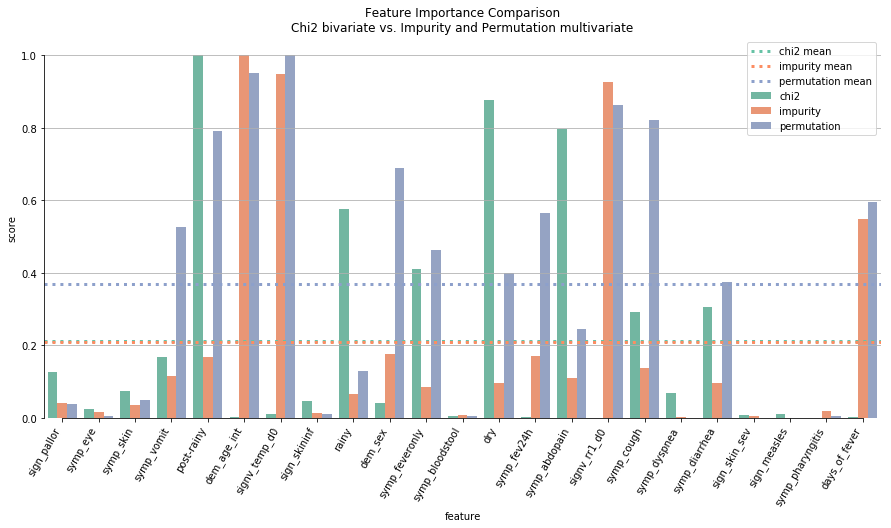

In [51]:
fig, ax = plt.subplots(figsize=(15,7),ncols=1)
palette="Set2"
sns.barplot(x="feature",y="score",hue="type", palette=palette, log=False, data=multiv,ax=ax)
# ax.axhline(mom, color="black", linestyle="--",label="Mean of mean of scores")

palette_sns=sns.color_palette(palette)
for idx, val in enumerate(mom.score.values):
    ax.axhline(val, color=palette_sns[idx], label = mom.iloc[idx].type + " mean", linestyle=":", linewidth=3)

    

ax.xaxis.set_tick_params(rotation=60)
ax.set_xticklabels(labels=multiv.feature.values,ha="right")
ax.legend(bbox_to_anchor=(1,1))
ax.set_ylabel("score")

ax.set_title("Feature Importance Comparison\nChi2 bivariate vs. Impurity and Permutation multivariate")
sns.despine(trim=True)


#### Creating an interactive view of the feature importances

same as above, but not using the Min-Max scaler, rather using a log vs linear plot.

In [52]:
import plotly.graph_objects as go

import pandas as pd

fig = go.Figure()

fig.add_trace(go.Bar(x=multiv[multiv["type"]=="chi2"]["feature"],
                     y=multiv[multiv["type"]=="chi2"]["score"],
                     name="Chi2"))
fig.add_trace(go.Bar(x=multiv[multiv["type"]=="impurity"]["feature"],
                     y=multiv[multiv["type"]=="impurity"]["score"],
                     name="forest"))
fig.add_trace(go.Bar(x=multiv[multiv["type"]=="permutation"]["feature"],
                     y=multiv[multiv["type"]=="permutation"]["score"],
                     name="permutation"))


fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=1.0,
            y=1.2,
            buttons=list([
                dict(label="Linear",
                     method="update",
                     args=[{"visible": [True, True, True]},
                           {"yaxis":{"title":"value","type":"linear"}}]),
                dict(label="Log",
                     method="update",
                     args=[{"visible": [True, True, True]},
                           {"yaxis":{"title":"log(value)","type":"log"}}]),
            ]),
        )
    ])


fig.update_xaxes(
    tickangle = 270,
    title_text = "Features",
    title_font = {"size": 15},
    title_standoff = 20)
fig.update_yaxes(title_text="value")



fig.update_layout(
    barmode='group',
    title="Feature Importance Comparison"
)





fig.show()

#### Feature Importances with CIs

rior to inspecting the feature importances, it is important to check that the model predictive performance is high enough. Indeed there would be little interest of inspecting the important features of a non-predictive model.

Here one can observe that the train accuracy is very high (the forest model has enough capacity to completely memorize the training set) but it can still generalize well enough to the test set thanks to the built-in bagging of random forests.

It might be possible to trade some accuracy on the training set for a slightly better accuracy on the test set by limiting the capacity of the trees (for instance by setting min_samples_leaf=5 or min_samples_leaf=10) so as to limit overfitting while not introducing too much underfitting.

However let’s keep our high capacity random forest model for now so as to illustrate some pitfalls with feature importance on variables with many unique values.

In [53]:
# print("RF train accuracy: %0.3f" % rf.score(X_train, y_train))
# print("RF test accuracy: %0.3f" % rf.score(X_test, y_test))

##### Permutation Importance vs Random Forest Feature Importance (MDI)

The impurity-based feature importance ranks the numerical features to be the most important features. As a result, the non-predictive random_num variable is ranked the most important!

This problem stems from two limitations of impurity-based feature importances:

impurity-based importances are biased towards high cardinality features;

impurity-based importances are computed on training set statistics and therefore do not reflect the ability of feature to be useful to make predictions that generalize to the test set (when the model has enough capacity).

================================================================
##### Permutation Importance vs Random Forest Feature Importance (MDI)
================================================================

In this example, we will compare the impurity-based feature importance of
:class:`~sklearn.ensemble.RandomForestClassifier` with the
permutation importance on the titanic dataset using
:func:`~sklearn.inspection.permutation_importance`. We will show that the
impurity-based feature importance can inflate the importance of numerical
features.

Furthermore, the impurity-based feature importance of random forests suffers
from being computed on statistics derived from the training dataset: the
importances can be high even for features that are not predictive of the target
variable, as long as the model has the capacity to use them to overfit.

This example shows how to use Permutation Importances as an alternative that
can mitigate those limitations.

Prior to inspecting the feature importances, it is important to check that
the model predictive performance is high enough. Indeed there would be little
interest of inspecting the important features of a non-predictive model.

Here one can observe that the train accuracy is very high (the forest model
has enough capacity to completely memorize the training set) but it can still
generalize well enough to the test set thanks to the built-in bagging of
random forests.

It might be possible to trade some accuracy on the training set for a
slightly better accuracy on the test set by limiting the capacity of the
trees (for instance by setting ``min_samples_leaf=5`` or
``min_samples_leaf=10``) so as to limit overfitting while not introducing too
much underfitting.

However let's keep our high capacity random forest model for now so as to
illustrate some pitfalls with feature importance on variables with many
unique values.



##### Tree's Feature Importance from Mean Decrease in Impurity (MDI)
--------------------------------------------------------------
The impurity-based feature importance ranks the numerical features to be the
most important features. As a result, the non-predictive ``random_num``
variable is ranked the most important!

This problem stems from two limitations of impurity-based feature
importances:

- impurity-based importances are biased towards high cardinality features;
- impurity-based importances are computed on training set statistics and
  therefore do not reflect the ability of feature to be useful to make
  predictions that generalize to the test set (when the model has enough
  capacity).


As an alternative, the permutation importances of ``rf`` are computed on a
held out test set. This shows that the low cardinality categorical feature,
``sex`` is the most important feature.

Also note that both random features have very low importances (close to 0) as
expected.


It is also possible to compute the permutation importances on the training
set. This reveals that ``random_num`` gets a significantly higher importance
ranking than when computed on the test set. The difference between those two
plots is a confirmation that the RF model has enough capacity to use that
random numerical feature to overfit. You can further confirm this by
re-running this example with constrained RF with min_samples_leaf=10.

In [54]:
# here we are using the feature permutation NOT the impurity based importance
result_val = permutation_importance(model_forest, val_X, val_y, n_repeats=10, scoring='neg_mean_squared_error',
                                random_state=42, n_jobs=2)

result_train = permutation_importance(model_forest, train_X, train_y, n_repeats=10, scoring='neg_mean_squared_error',
                                random_state=42, n_jobs=2)

boxplot_val = pd.DataFrame(result_val.importances,
             index = val_X.columns).reset_index().rename({"index":"feature"},
                                                         axis=1).melt(id_vars=["feature"],
                                                                      var_name="try",
                                                                      value_name="value").drop(["try"],axis=1)
boxplot_val["type"]="val"
boxplot_train = pd.DataFrame(result_train.importances,
             index = val_X.columns).reset_index().rename({"index":"feature"},
                                                         axis=1).melt(id_vars=["feature"],
                                                                      var_name="try",
                                                                      value_name="value").drop(["try"],axis=1)
boxplot_train["type"]="train"
boxplot=boxplot_val.append(boxplot_train)
boxplot.sort_values(by=["type","value"],ascending=False,inplace=True)

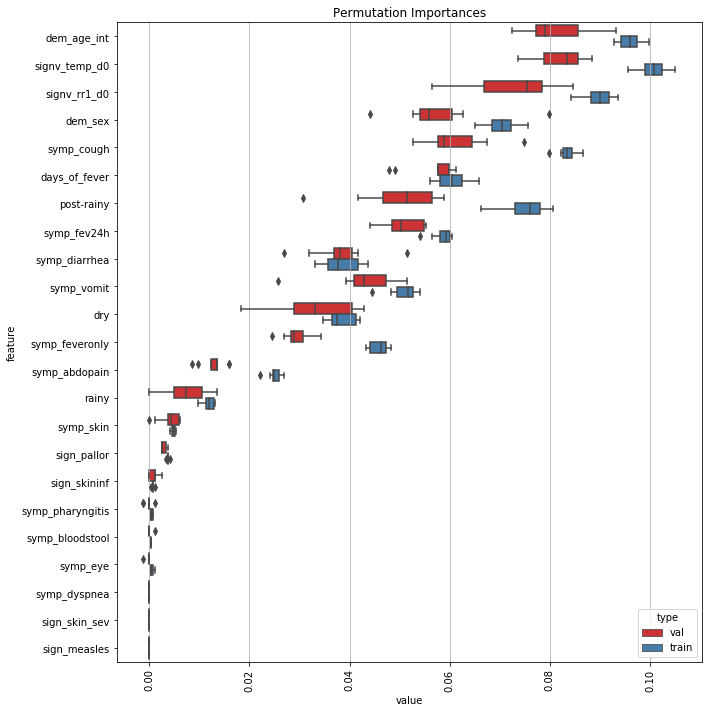

In [55]:
fig, ax = plt.subplots(figsize=(10,10),ncols=1)

sns.boxplot(y="feature",x="value",hue="type",palette="Set1",orient="h",data=boxplot)
ax.set_title("Permutation Importances")
ax.xaxis.set_tick_params(rotation=90)

fig.tight_layout()
plt.show()

In [56]:
from sklearn.feature_selection import chi2
import numpy as np, scipy.stats as st

In [57]:
n_boot=100
n_sample = train_X.shape[0]
boot_scores=[]

z_score=1.96

for i in range(n_boot):
    indices = np.random.randint(0, train_X.shape[0], n_sample)    
    scores, pvalues=chi2(train_X.reset_index(drop=True).iloc[indices],
                                   train_y.reset_index(drop=True).iloc[indices])
    
    boot_scores.append(scores)
    
    
mean=np.mean(boot_scores, axis=0)
std=np.std(boot_scores,axis=0)
error=z_score*std/np.sqrt(n_sample)


#     X  ±  Z s√n 
# X is the mean
# Z is the chosen Z-value from the table above
# s is the standard deviation
# n is the number of observations

    

###### Concerning the chi2 test
- what if "expected frequency count" has a value of zero... then the computation of the chi-2 statistic would be off, because you would be dividing by zero. This would yield a nan value in the code, which if used in a mean computation would spread to the whole mean for example...
This could be the case when evaluating for example a binary feature, which has a lot of one of the values, but very little of the other. 

Let's verify this: look at `sign_measles`:

In [58]:
train_X["sign_measles"].value_counts()

0.0    2443
1.0       2
Name: sign_measles, dtype: int64

In [59]:
boxplot_chi2=pd.DataFrame(boot_scores,columns=val_X.columns).T.reset_index().rename({"index":"feature"}, axis=1)\
.melt(id_vars=["feature"],var_name="iter",value_name="value").drop(["iter"],axis=1)
boxplot_chi2["type"]="chi2"
boxplot_chi2=pd.merge(boxplot_chi2, boxplot_chi2.groupby("feature").agg({"value":"mean"}).rename({"value":"mean"},axis=1), on="feature")
boxplot_chi2.sort_values(by=["value"],ascending=False,inplace=True)

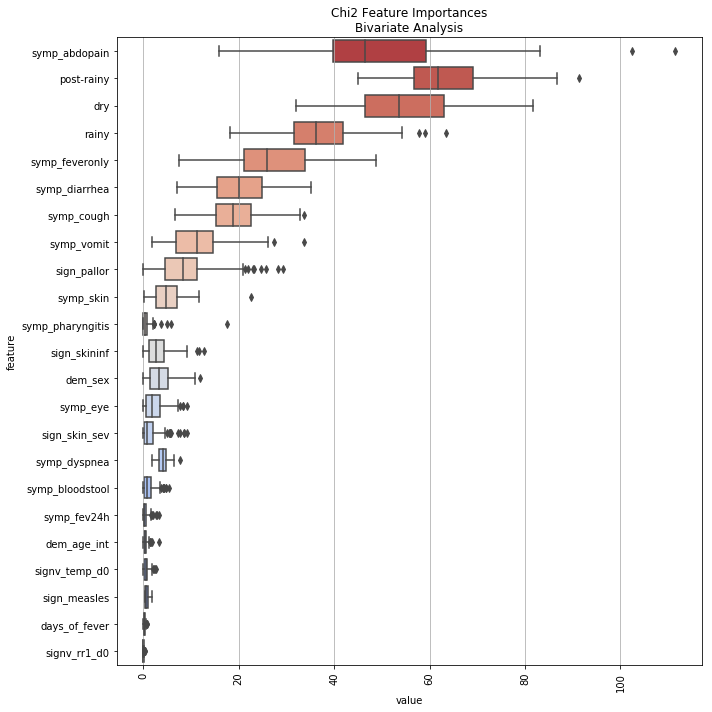

In [60]:
fig, ax = plt.subplots(figsize=(10,10),ncols=1)

sns.boxplot(y="feature",x="value",palette="coolwarm_r",orient="h",data=boxplot_chi2)
ax.set_title("Chi2 Feature Importances\nBivariate Analysis")
ax.xaxis.set_tick_params(rotation=90)

fig.tight_layout()
plt.show()

In [61]:
boxplot_comp = pd.merge(boxplot_val,
                        boxplot_chi2, 
                        on=["feature","type","value"],
                        how="outer").drop(["mean"],
                                          axis=1)
boxplot_comp["value"] = boxplot_comp.apply(lambda x: x["value"]/boxplot_val["value"].max()\
                                           if x["type"]=="val" \
                                           else x["value"]/boxplot_chi2["value"].max(),axis=1)
boxplot_comp["order"] = boxplot_comp.apply(lambda x: 0 if x["type"]=="chi2" else 1, axis=1)
boxplot_comp.sort_values(by=["order","value"],ascending=False,inplace=True)

boxplot_comp["type"]= boxplot_comp["type"].apply(lambda x: "Permutation" if x=="val"else "Chi-2")

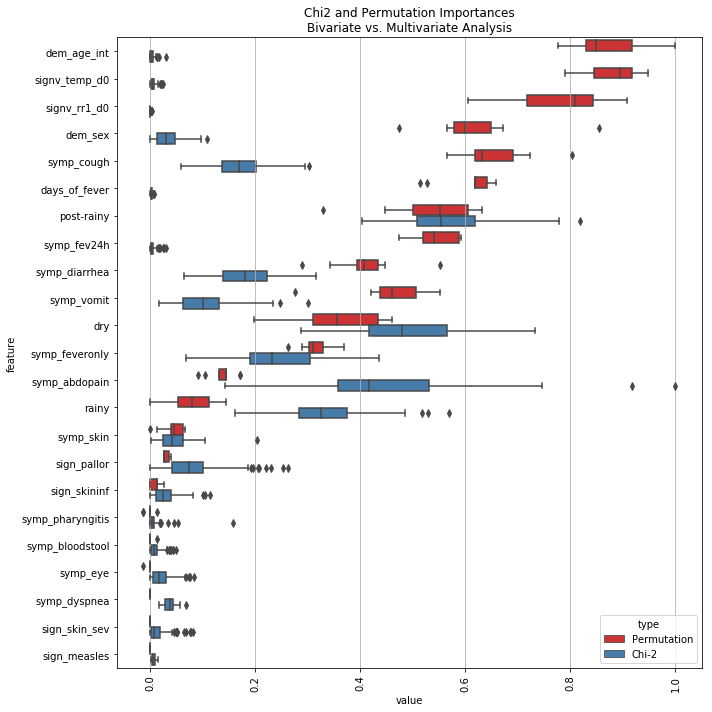

In [62]:
fig, ax = plt.subplots(figsize=(10,10),ncols=1)

sns.boxplot(y="feature",
            x="value",
            palette="Set1",
            saturation=0.75,
            hue="type",
            orient="h",
            data=boxplot_comp)
ax.set_title("Chi2 and Permutation Importances\nBivariate vs. Multivariate Analysis")
ax.xaxis.set_tick_params(rotation=90)

fig.tight_layout()
plt.show()

#### Feature Importances with CI, interactive plot

In [63]:
colordict={"Chi-2":"blue","Permutation":"red"}

fig = go.Figure()





fig.add_trace(go.Box(y=boxplot_comp[boxplot_comp["type"]=="Permutation"]["value"],
                     x=boxplot_comp[boxplot_comp["type"]=="Permutation"]["feature"],
                     orientation="v",
                     name="Permutation",
                    ))
fig.add_trace(go.Box(y=boxplot_comp[boxplot_comp["type"]=="Chi-2"]["value"],
                     x=boxplot_comp[boxplot_comp["type"]=="Chi-2"]["feature"],
                     orientation="v",
                     name="Chi-2",
                    ))

fig.update_layout(
    title="Feature Importance: Bivariate vs. Multivariate Analysis<br>Resp. Chi-2 vs. Permutation",
    boxmode="group",
    hovermode="x unified"
    
)


fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="black",
        font_size=16,
        font_family="Rockwell"
    )
)


fig.show()

#### feature permutation, with and without confounding features
To evaluate which features were most impactful in the model predictions, we will use a feature permutation technique.
The idea behind feature permutation is to take a feature, switch around its data points (solely for that column/feature), and evaluate the model with the newly shuffled feature (but every other feature remaining as before). Doing that several times per feature yields an estimate of how important the feature is when compared to a randomly shuffled version of itself, on average, for the prediction.

In [64]:
perm = eli5.sklearn.PermutationImportance(model_forest, random_state=1).fit(val_X, val_y)
eli5.show_weights(perm, feature_names = val_X.columns.tolist())

Weight,Feature
0.0856 ± 0.0141,signv_temp_d0
0.0810 ± 0.0096,dem_age_int
0.0736 ± 0.0117,signv_rr1_d0
0.0660 ± 0.0042,symp_cough
0.0587 ± 0.0170,dem_sex
0.0560 ± 0.0213,post-rainy
0.0555 ± 0.0132,days_of_fever
0.0491 ± 0.0128,symp_fev24h
0.0434 ± 0.0139,symp_vomit
0.0358 ± 0.0116,dry


here we can see that some features have a score of 0. This leads us to believe that if we were to take out this features entirely - while leaving out every other feature- we would obtain the same predictions as if we kept them.

This is the principle used for Boruta feature selection. 

what about when we run it on the confounded model!?

In [65]:
perm = eli5.sklearn.PermutationImportance(model_forest_c, random_state=1).fit(val_X_c, val_y_c)
eli5.show_weights(perm, feature_names = val_X_c.columns.tolist())

Weight,Feature
0.2410 ± 0.0208,dxlab_malaria_hsrdt
0.0984 ± 0.0039,dxlab_malaria_low
0 ± 0.0000,dxlab_malaria_hi
0 ± 0.0000,symp_vomit
0 ± 0.0000,post-rainy
0 ± 0.0000,dem_age_int
0 ± 0.0000,signv_temp_d0
0 ± 0.0000,sign_skininf
0 ± 0.0000,rainy
0 ± 0.0000,dem_sex


here we obtain different results: we could already see from this analysis that we have two confounding factors which pretty much entirely are responsible for the model output!

### Feature importance evalution: based on instances
#### Shapley values (and Shapley additive explanations)
- shap values give us an estimate of the contribution importance of a feature to the overall model prediction.
- the way it is evaluated is a bit more complex than for feature importance, but it is the same overall idea. The principle is to evaluate a feature's contribution in all possible cases (DETAIL).
- however, this method is run per-data point. Meaning that instead of evaluating the global impact of a feature, we are evaluating each feature's single instances' impact on a prediction. This takes much more time to run (NP-hard)


The additive nature of Shapley values
One the fundemental properties of Shapley values is that they always sum up to the difference between the game outcome when all players are present and the game outcome when no players are present. For machine learning models this means that SHAP values of all the input features will always sum up to the difference between baseline (expected) model output and the current model output for the prediction being explained. The easiest way to see this is through a waterfall plot that starts our background prior expectation for a home price E[f(X)], and then adds features one at a time until we reach the current model output f(x):

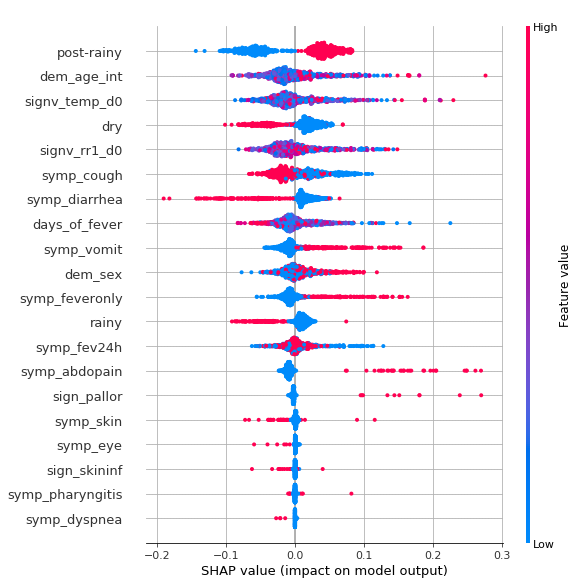

In [66]:
shap_explainer = shap.TreeExplainer(model_forest)
shap_values = shap_explainer.shap_values(val_X)
shap.summary_plot(shap_values[1], val_X)

Here:
- the x axis is a score of importance called the SHAP value (impact on model output)
    - we can see that all importance scores are relative to the "zero" value.
- the y axis is the list of features on which the method was applied.
- For each "row" (so each feature), one point represents one data point for which the method was run.
    - if the data point is more "to the left" then the zero value, the feature has a negative impact on the prediction
    - if the data point is more "to the right" then the zero value, the feature has a positive impact on the prediction.
    - if the data point is at the zero value, the feature had no impact on the prediction for this data point
    - having a negative impact can be as important as having a positive impact (think of it as correlation)
- for each point, the color indicates the feature's value, based on the scale on the right. The values are relative to the mean value (OR IS IT MEDIAN). 
    - a data point colore in red indicates that the value of this data point for this feature was above average compared to all other data points (for the same feature)
    
Therefore:
- for example we can see that for the `signv_temp_d0` feature (the second one), we have a lot of points on the left of the zero value, and they are mostly blue, and we have some points to the right of the zero value, and they are almost all red. This seems to indicate that low values of temperature consistently impact the prediction negatively (meaning more likely to predict "0" label = no malaria) while high values of temperature consistently impact the prediction postiively (meaning "1" label = malaria). The higher/lower the temperature (based on color), the stronger the impact (data points on the far ends are more "red"/"blue" than in the middle, and have a stronger impact (since they are at the far ends).

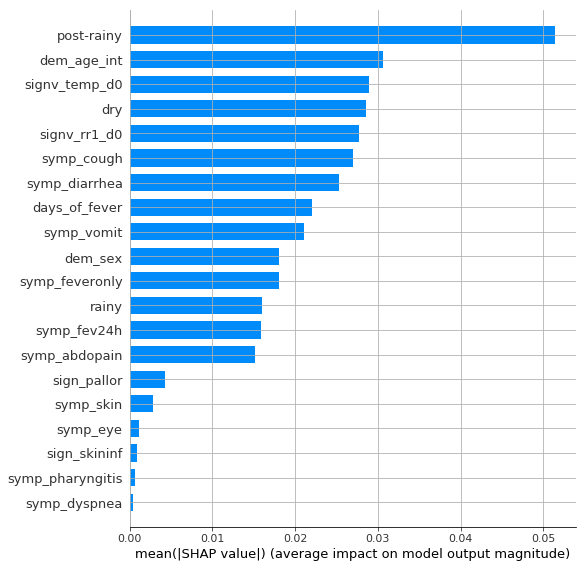

In [67]:
shap.summary_plot(shap_values[1], val_X, plot_type = "bar")

##### Individual value

This is the same plot as previously seen, but the data points are not taken separately, and the impact is measured as an absolute impact instead of having positive and negative values.

In [68]:
for i in [0,3,9,22]:
    print(i, preds[i],val_y.iloc[i].values[0])

0 0 0
3 0 1
9 0 1
22 0 0


In [69]:
val_X.iloc[0]

sign_pallor         0.000000
symp_eye            0.000000
symp_skin           0.000000
symp_vomit          0.000000
post-rainy          1.000000
dem_age_int         0.649123
signv_temp_d0       0.266667
sign_skininf        0.000000
rainy               0.000000
dem_sex             0.000000
symp_feveronly      0.000000
symp_bloodstool     0.000000
dry                 0.000000
symp_fev24h         0.000000
symp_abdopain       0.000000
signv_rr1_d0        0.114286
symp_cough          1.000000
symp_dyspnea        0.000000
symp_diarrhea       0.000000
sign_skin_sev       0.000000
sign_measles        0.000000
symp_pharyngitis    0.000000
days_of_fever       0.071429
Name: 1060, dtype: float64

The below explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue

In [70]:
shap.initjs()
# 0,3,9,22
# TN,TP,FN,FP
i=2
print("TN\nTrue Label: {}\n".format(val_y.iloc[i]))
shap.force_plot(shap_explainer.expected_value[1],shap_values[1][i,:], val_X.iloc[i,:])

TN
True Label: lab_malaria_any_d0    0
Name: 297, dtype: int64



In [71]:
shap.initjs()
# 0,3,9,22
# TN,TP,FN,FP
i=3
print("TP\nTrue Label: {}\n".format(val_y.iloc[i]))
shap.force_plot(shap_explainer.expected_value[1],shap_values[1][i,:], val_X.iloc[i,:])

TP
True Label: lab_malaria_any_d0    1
Name: 1525, dtype: int64



In [72]:
shap.initjs()
# 0,3,9,22
# TN,TP,FN,FP
i=9
print("FN\nTrue Label: {}\n".format(val_y.iloc[i]))
shap.force_plot(shap_explainer.expected_value[1],shap_values[1][i,:], val_X.iloc[i,:])


FN
True Label: lab_malaria_any_d0    1
Name: 2995, dtype: int64



In [73]:
shap.initjs()
# 0,3,9,22
# TN,TP,FN,FP
i=22
print("FP\nTrue Label: {}\n".format(val_y.iloc[i]))
shap.force_plot(shap_explainer.expected_value[1],shap_values[1][i,:], val_X.iloc[i,:])

FP
True Label: lab_malaria_any_d0    0
Name: 2776, dtype: int64



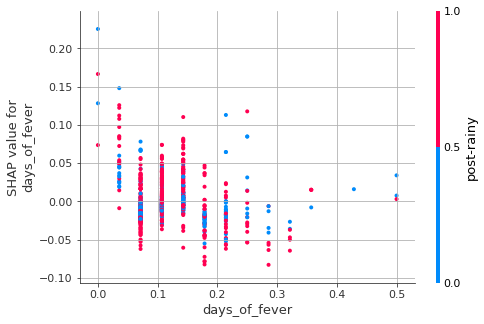

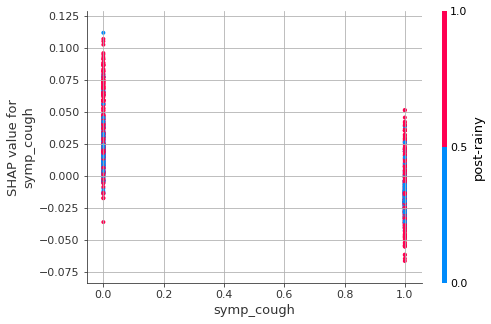

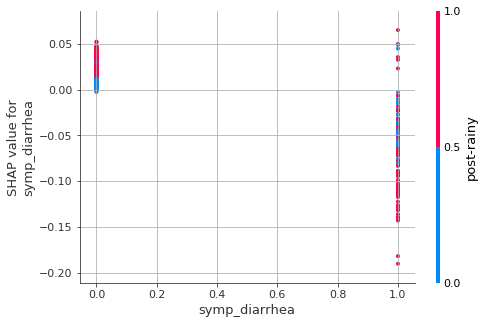

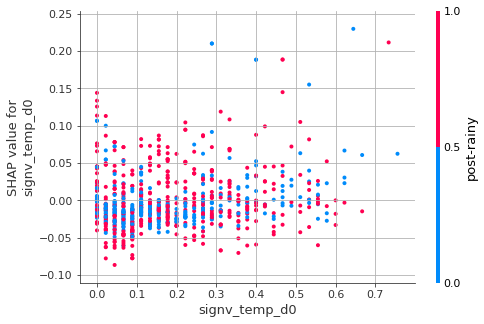

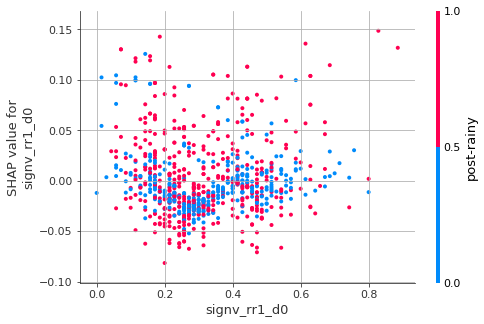

In [74]:
Xoi = "post-rainy"
for name in ["days_of_fever","symp_cough","symp_diarrhea","signv_temp_d0","signv_rr1_d0"]:
    shap.dependence_plot(name, shap_values[1], val_X, interaction_index=Xoi)

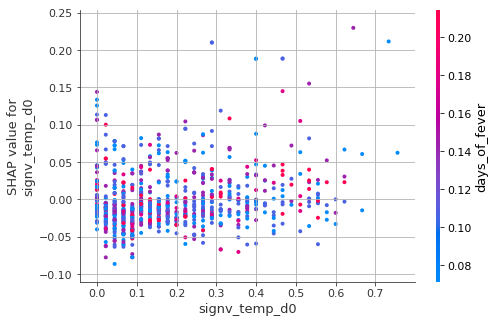

In [75]:
shap.dependence_plot("signv_temp_d0", shap_values[1], val_X, interaction_index = "days_of_fever")

The plot above does not yield a clear "trend", either between the importance of the `signv_temp_d0` feature and its actual values, or between these two and the `days_of_fever` feature.

There is a small trend that is observable, in that the highest / most extreme SHAP importance values for the temperature feature are those with higher values of temperature.

We can also see that the most extreme temperatures often don't have the highest number of days of fever.

This plot above is sort of like a partial dependence plot but applied to SHAP values. We can see that for the feature "days of fever", if we look at it in terms of its associated "signv temp d0", there are no real correlation to be seen.
- if all values to the right (high value for days of fever) were consistently high on the y axis (high importance with respect to the prediction) and were also consistently of one color, we could see that there is a correlation between days of fever and signv temp d0, potentially.

#### LIME explainer


not in our package: kernel_width – kernel width for the exponential kernel. If None, defaults to sqrt (number of columns) * 0.75


Same as for Shap: it is at the instance level... So might be interesting to use this for data points which we think are representative, or for those which we think are totally mis-classified.

The idea behind this tool is to try and reproduce the model's behavior using a more "explainable" model locally (around the neighborhood of a data point). Explainable models are usually linear and with few coefficients.

![](https://raw.githubusercontent.com/marcotcr/lime/master/doc/images/lime.png)

Intuitively, an explanation is a local linear approximation of the model's behaviour. While the model may be very complex globally, it is easier to approximate it around the vicinity of a particular instance. While treating the model as a black box, we perturb the instance we want to explain and learn a sparse linear model around it, as an explanation. The figure below illustrates the intuition for this procedure. The model's decision function is represented by the blue/pink background, and is clearly nonlinear. The bright red cross is the instance being explained (let's call it X). We sample instances around X, and weight them according to their proximity to X (weight here is indicated by size). We then learn a linear model (dashed line) that approximates the model well in the vicinity of X, but not necessarily globally. 

While the overall boundary might be complex, local boundaries could be found that are linear.

The recipe for training local surrogate models:
- Select your instance of interest for which you want to have an explanation of its black box prediction.
- Perturb your dataset and get the black box predictions for these new points.
- Weight the new samples according to their proximity to the instance of interest.
- Train a weighted, interpretable model on the dataset with the variations.
- Explain the prediction by interpreting the local model.

It is best to visually explain how sampling and local model training works:


![](https://christophm.github.io/interpretable-ml-book/images/lime-fitting-1.png)

As always, the devil is in the detail. Defining a meaningful neighborhood around a point is difficult. LIME currently uses an exponential smoothing kernel to define the neighborhood. A smoothing kernel is a function that takes two data instances and returns a proximity measure. The kernel width determines how large the neighborhood is: A small kernel width means that an instance must be very close to influence the local model, a larger kernel width means that instances that are farther away also influence the model. If you look at LIME's Python implementation (file lime/lime_tabular.py) you will see that it uses an exponential smoothing kernel (on the normalized data) and the kernel width is 0.75 times the square root of the number of columns of the training data. It looks like an innocent line of code, but it is like an elephant sitting in your living room next to the good porcelain you got from your grandparents. The big problem is that we do not have a good way to find the best kernel or width. And where does the 0.75 even come from? In certain scenarios, you can easily turn your explanation around by changing the kernel width, as shown in the following figure:



The correct definition of the neighborhood is a very big, unsolved problem when using LIME with tabular data. In my opinion it is the biggest problem with LIME and the reason why I would recommend to use LIME only with great care. For each application you have to try different kernel settings and see for yourself if the explanations make sense. Unfortunately, this is the best advice I can give to find good kernel widths.

Sampling could be improved in the current implementation of LIME. Data points are sampled from a Gaussian distribution, ignoring the correlation between features. This can lead to unlikely data points which can then be used to learn local explanation models.

The complexity of the explanation model has to be defined in advance. This is just a small complaint, because in the end the user always has to define the compromise between fidelity and sparsity.

Another really big problem is the instability of the explanations. In an article 38 the authors showed that the explanations of two very close points varied greatly in a simulated setting. Also, in my experience, if you repeat the sampling process, then the explantions that come out can be different. Instability means that it is difficult to trust the explanations, and you should be very critical.

Conclusion: Local surrogate models, with LIME as a concrete implementation, are very promising. But the method is still in development phase and many problems need to be solved before it can be safely applied.

Basically: not the best method either...

In [76]:
# lime_explainer= lime.lime_tabular.LimeTabularExplainer(np.array(train_X),
#                                                  feature_names=X_labels,
#                                                  categorical_features=all_categorical,
#                                                  mode="classification")

In [77]:
cat_idx=pd.DataFrame(train_X.columns,columns=["feature"]).reset_index()
cat_idx["cat"]=cat_idx.apply(lambda x: True if x["feature"] in all_categorical else False, axis = 1)
cat_idx = list(cat_idx[cat_idx["cat"]==True]["index"])

In [81]:
# need to train the lime explainer on data before evaluating it of course!
predict_fn_rf = lambda x: model_forest.predict_proba(x).astype(float)
X = train_X.values
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X,
                                                        feature_names = train_X.columns,
                                                        class_names=['Malaria Negative','Malaria Positive'],
                                                        categorical_features=cat_idx,
                                                        discretize_continuous=True,
                                                        kernel_width=3)


Below: The graphs represent how the simplified, approximative model behaves at the point evaluated. 
- on the left: we have the probabilities associated to the prediction of each class. The second example shows a 0.90 percent probability associated to the malaria positive class. The color code remains the same throughout the graph, so any feature associated to the "Malaria Positive" prediction will be color-coded in orange.
- in the middle: we have the relative impact of each feature with regards to the prediction probability. The `sign_pallor` feature, if it is at a value lower or equal to 0 (which is the case here), has an importance score of 0.11 in determining the outcome. The `dem_age_int`feature, if it has a value of above 0.39 (which is the case here), has an importance score of 0.10 in determining the outcome.
- on the right: we have the different features and their values at the point being evaluated. In our case, the data point had a value of 0 for the `sign_pallor` feature, a value of 0.70 for the `dem_age_int` feature, etc... These values are the input fed into the model.


this is a good example: https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html

 For categorical features, the feature contribution is always the same as the linear model weight.



Now note that the explanations are based not only on features, but on feature-value pairs. For example, we are saying that odor=foul is indicative of a poisonous mushroom. In the context of a categorical feature, odor could take many other values (see below). Since we perturb each categorical feature drawing samples according to the original training distribution, the way to interpret this is: if odor was not foul, on average, this prediction would be 0.24 less 'poisonous'. Let's check if this is the case



let's take a look at correct classifications and misclassifications to try to understand what happened:

In [252]:
preds=model_forest.predict(val_X)
classified = pd.DataFrame(np.column_stack((preds, val_y)), columns=["predictions","labels"])
classified[classified.predictions!=classified.labels].head()

,predictions,labels
8,1,0
9,0,1
12,0,1
22,1,0
30,0,1


In [254]:
classified[classified.predictions==classified.labels].head()

,predictions,labels
0,0,0
1,0,0
2,0,0
3,1,1
4,0,0


In [262]:
tn=classified[classified.predictions==classified.labels][classified.predictions==0].index[0]
tp=classified[classified.predictions==classified.labels][classified.predictions==1].index[0]
fn=classified[classified.predictions!=classified.labels][classified.predictions==0].index[0]
fp=classified[classified.predictions!=classified.labels][classified.predictions==1].index[0]

C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\ipykernel_launcher.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\theop\Anaconda3\envs\env_ipynb\lib\site-packages\ipykernel_launcher.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



True negative:

In [264]:
print(classified.iloc[tn])

predictions    0
labels         0
Name: 0, dtype: int64


In [263]:
exp = lime_explainer.explain_instance(val_X.iloc[tn], predict_fn_rf)
exp.show_in_notebook()

True positive:

In [267]:
print(classified.iloc[tp])

predictions    1
labels         1
Name: 3, dtype: int64


In [266]:
exp = lime_explainer.explain_instance(val_X.iloc[tp], predict_fn_rf)
exp.show_in_notebook()

False Negative:

In [268]:
print(classified.iloc[fn])

predictions    0
labels         1
Name: 9, dtype: int64


In [269]:
exp = lime_explainer.explain_instance(val_X.iloc[fn], predict_fn_rf)
exp.show_in_notebook()

False positive:

In [270]:
print(classified.iloc[fp])

predictions    1
labels         0
Name: 8, dtype: int64


In [271]:
exp = lime_explainer.explain_instance(val_X.iloc[fp], predict_fn_rf, num_features=25)
exp.show_in_notebook()

Note that LIME has discretized the features in the explanation. This is because we let discretize_continuous=True in the constructor (this is the default). Discretized features make for more intuitive explanations.



This result can be tough to interpret and at times does not yield much information. Let's take a look at features going from most important to least important, according to the LIME explainer.

1) In all cases, we can see that the `abdominal_pain` and `sign_pallor` were always pushing towards "malaria negative" for a value of 0.

2) For misclassifications, `post-rainy` and `symp__diarrhea` were variant.
- for true negative: `post-rainy` pushed towards "malaria positive" with a value of 1
- for true positive: `post-rainy` pushed towards "malaria negative" with a value of 0
- for false negative: `post-rainy` pushed towards "malaria positive" with a value of 1
- for false positive: `post-rainy` pushed towards "malaria positive" with a value of 1

We can see that maybe the fact that the `post-rainy` had a value of 1 led to a misclassification in the case of the false positive we saw. The LIME explainer expected values of 1 to go towards "malaria positive" and values of 0 to go the other way.

- for true negative: `symp_diarrhea` pushed towards "malaria positive" with a value of 0
- for true positive: `symp_diarrhea` pushed towards "malaria positive" with a value of 0
- for false negative: `symp_diarrhea` pushed towards "malaria negative" with a value of 1
- for false positive: `symp_diarrhea` pushed towards "malaria positive" with a value of 0



<br><br>
We can see that maybe the fact that the `symp_diarrhea` had a value of 1 led to a misclassification in the case of the false negative we saw. The LIME explainer expected values of 0 to go towards "malaria positive' and values of 0 to go the other way.

If we continue we can interpret all feature values, however the "lower end" features had much less importance in the LIME explainer prediction, therefore they can be ignored. 

It is important to remind ourselves that the model is a local approximation, hence it might be flawed. Moreover, looking at 1 case in particular does not explain the model as a whole, it only gives intuition on why it might behave the way it does.

#### Revisiting the LIME explainer


**REMINDER: feature need to be normalized else the coefficients in the surrogate model (linear) can't be interpreted on the same level!!!!**


We will tweak the plots so it's more clear.

visit: 

https://github.com/marcotcr/lime/blob/master/lime/explanation.py



In [349]:
# 0,3,9,22
# TN,TP,FN,FP
# false positive:
idx=fp
model_pred=preds[idx]
true_value = val_y.iloc[idx][0]
exp = lime_explainer.explain_instance(val_X.iloc[idx], predict_fn_rf, num_features=25)
surrogate_pred = exp.predict_proba.argmax()
explained = exp.as_list()

In [450]:
input_data = pd.DataFrame(val_X.iloc[idx]).reset_index().rename({"index":"feature"},axis=1)
input_data.rename({input_data.columns[1]:"input_value"},axis=1, inplace=True)

explained_data = pd.DataFrame(explained, columns = ["feature_threshold","coefficient_value"], index = val_X.columns).reset_index().rename({"index":"feature"},axis=1)

exp_map=pd.DataFrame(exp.as_map()[1], columns = ["feat_idx","coeff"])
# Map from label to list of tuples (feature_id, weight).
# first key is "1" and is the only key apparently. should check that
all_idx=pd.DataFrame(train_X.columns,columns=["feature"]).reset_index().rename({"index":"feat_idx"},axis=1)

explained_data=pd.merge(all_idx, exp_map, on = "feat_idx")
explained_data = pd.merge(explained_data, input_data, on = "feature")
thr=pd.DataFrame(exp.as_list(),columns=["threshold","coeff"])
explained_data = pd.merge(explained_data, thr, on = "coeff")
explained_data["prediction_force"] = explained_data.apply(lambda x: "malaria+" if x["coeff"]>=0 else "malaria-",axis=1)
explained_data["abs_coeff"] = explained_data["coeff"].apply(np.abs)
explained_data.sort_values(by=["abs_coeff"], inplace=True, ascending = False)
explained_data["cumsum_coeff"] = explained_data["coeff"].cumsum()
explained_data.sort_values(by=["coeff"],inplace=True)
sum_coeff = explained_data.coeff.sum()

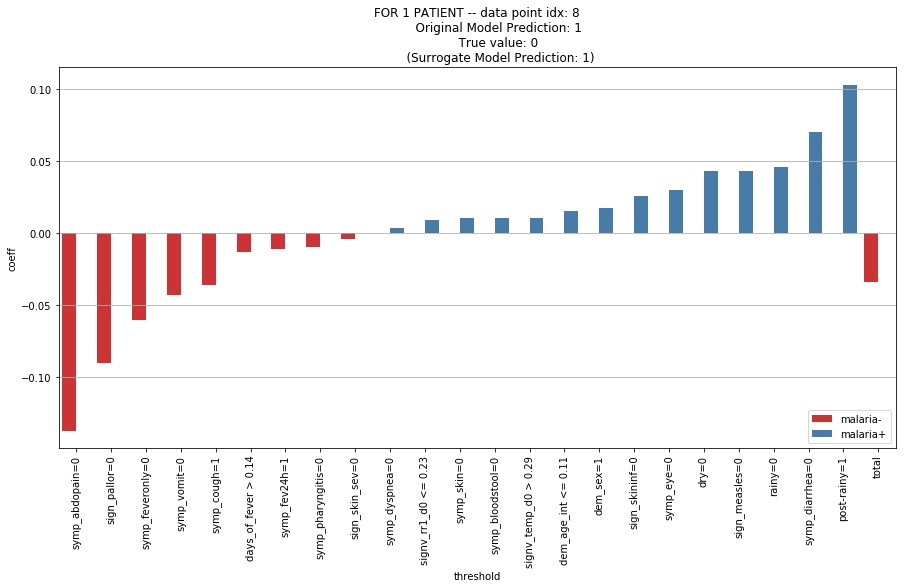

In [451]:
last_cumsum = explained_data.cumsum_coeff.iloc[-1]
output_sign = "malaria+" if last_cumsum>0 else "malaria-"
adding_df = pd.DataFrame([[explained_data.feat_idx.max()+1,
               "total",
               last_cumsum,
               None, 
               "total",
               output_sign,
               None,
               last_cumsum]], columns= explained_data.columns)
explained_data_total=explained_data.append(adding_df)
colordict = {"malaria-":"red","malaria+":"blue"}
# colordict["malaria+"]
explained_data_total["color"] = explained_data_total["prediction_force"].apply(lambda x: colordict[x])

fig, ax = plt.subplots(figsize=(15,7))
palette="Set1"
palette_sns = sns.color_palette(palette)
sns.barplot(x="threshold", y="coeff", orient="v",hue="prediction_force", palette=palette,data=explained_data_total, ax=ax)
ax.xaxis.set_tick_params(rotation=90)

# to do : depends on the first coefficient of the dataframe....
# if there are negative coefficients they will be last so should be ok
color = palette_sns[0] if sum_coeff>0 else palette_sns[1]
# ax.axhline(y=sum_coeff, label = "Sum of all coefficients for 1 prediction", linestyle="--", color = color)
if sum_coeff>0 and sum_coeff>explained_data_total["cumsum_coeff"].max():
    ax.set_ylim(1.2)
elif sum_coeff<0 and sum_coeff<explained_data_total["cumsum_coeff"].min():
    ax.set_ylim(bottom=sum_coeff*1.2)
ax.set_title("FOR 1 PATIENT -- data point idx: {}\n\
            Original Model Prediction: {} \n\
            True value: {} \n\
            (Surrogate Model Prediction: {})".format(idx, model_pred, true_value, surrogate_pred))
plt.legend()
plt.show()

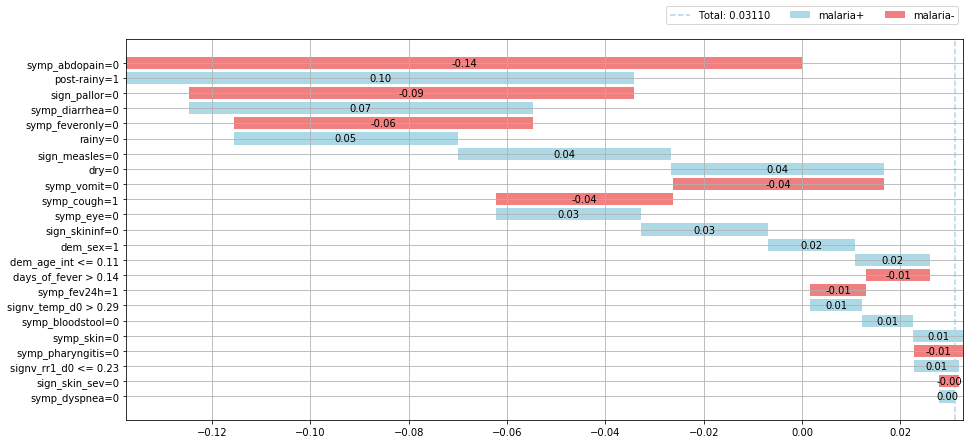

In [452]:
colordict = {"malaria-":"lightcoral","malaria+":"lightblue"}
color = colordict["malaria-"] if sum_coeff<0 else colordict["malaria+"]


# colordict["malaria+"]
explained_data["color"] = explained_data["prediction_force"].apply(lambda x: colordict[x])

explained_data.sort_values(by=["abs_coeff"],ascending=True,inplace=True)
fig, ax = plt.subplots(figsize=(15,7))
for i in range(explained_data.shape[0]):
    ax.barh(y=explained_data.threshold.iloc[i],
        width=explained_data.coeff.iloc[i], 
        left = explained_data.cumsum_coeff.iloc[i]-explained_data.coeff.iloc[i],
        color=explained_data.color.iloc[i],
        label=explained_data.prediction_force.iloc[i]
       )

    x_center = explained_data.cumsum_coeff.iloc[i] - explained_data.coeff.iloc[i]/2
    y_center=i
    text="{:.2f}".format(explained_data.coeff.iloc[i])
    ax.text(x_center,y_center,text,ha='center', va='center',color="black")

# ax.annotate('- contribution', 
#             xy=(explained_data.cumsum_coeff.max()*0.9, explained_data.shape[0]), 
#             xytext=(explained_data.cumsum_coeff.max(), explained_data.shape[0]-0.2), 
#             arrowprops=dict(arrowstyle="-|>",color='red'))

# ax.annotate('+ contribution', 
#             xy=(explained_data.cumsum_coeff.max()*0.9, explained_data.shape[0]-1), 
#             xytext=(explained_data.cumsum_coeff.max(), explained_data.shape[0]-1.2), 
#             arrowprops=dict(arrowstyle="<|-",color='blue'))


ax.axvline(x=explained_data.cumsum_coeff.iloc[0], 
           color=color,
           linestyle="--",
           zorder=-1,
           label = 'Total: {:.5f}'.format(explained_data.cumsum_coeff.iloc[0]))
handles, labels =ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.0,1.1),ncol=3)
# ax.set_xlim(left = explained_data.cumsum_coeff.min()*1.2, 
#             right=explained_data.cumsum_coeff.max()*1.2)
plt.show()

**what about if e.g. symp_abdopain=1.....?????**

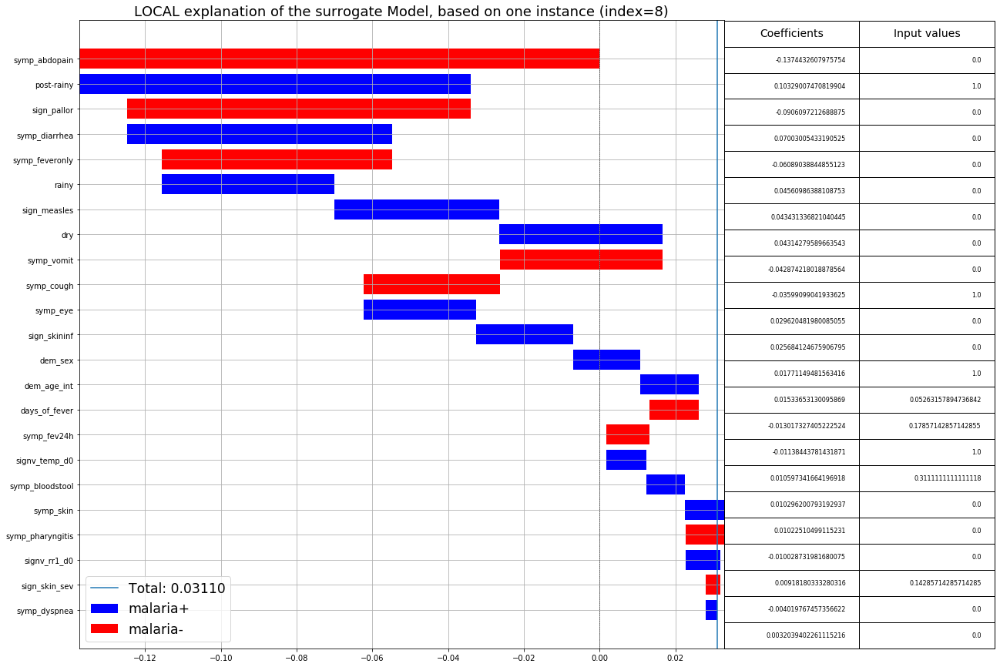

In [453]:
colordict = {"malaria-":"red","malaria+":"blue"}
# colordict["malaria+"]
explained_data["color"] = explained_data["prediction_force"].apply(lambda x: colordict[x])
explained_data.sort_values(by=["abs_coeff"],ascending=True,inplace=True)
fig, ax = plt.subplots(figsize=(15,15))
for i in range(explained_data.shape[0]):
    ax.barh(y=explained_data.feature.iloc[i],
        width=explained_data.coeff.iloc[i], 
        left = explained_data.cumsum_coeff.iloc[i]-explained_data.coeff.iloc[i],
        color=explained_data.color.iloc[i],
        label=explained_data.prediction_force.iloc[i]
       )        
ax.axvline(x=explained_data.cumsum_coeff.iloc[0], label = 'Total: {:.5f}'.format(explained_data.cumsum_coeff.iloc[0]))

ax.axvline(x=0,color="black",linestyle="--",linewidth=0.5)
handles, labels =ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc="lower left",fontsize="xx-large")


# ax.annotate('- contribution', 
#             xy=(explained_data.cumsum_coeff.max()*0.6, explained_data.shape[0]), 
#             xytext=(explained_data.cumsum_coeff.max()*0.7, explained_data.shape[0]-0.1), 
#             arrowprops=dict(arrowstyle="-|>",color='red'))

# ax.annotate('+ contribution', 
#             xy=(explained_data.cumsum_coeff.max()*0.6, explained_data.shape[0]-1), 
#             xytext=(explained_data.cumsum_coeff.max()*0.7, explained_data.shape[0]-1.1), 
#             arrowprops=dict(arrowstyle="<|-",color='blue'))
# ax.set_xlim(left = explained_data.cumsum_coeff.min()*1.2, 
#             right=explained_data.cumsum_coeff.max()*1.2)

cell_text=[[x,y]for x,y in zip(explained_data.iloc[::-1].coeff.values,explained_data.iloc[::-1].input_value.values)]


# Add a table at the bottom of the axes
table=ax.table(cellText=cell_text,
          colLabels=["Coefficients","Input values"],
         rowLoc="center",
         colLoc="center",
          colWidths=[.15,.15],
          loc='right')
table.scale(1.4,2.83)
table.auto_set_font_size(False)
table.set_fontsize(8)
table[0,0].set_fontsize(14)
table[0,1].set_fontsize(14)

ax.set_title("LOCAL explanation of the surrogate Model, based on one instance (index={})".format(idx),
            fontsize=18)
plt.show()

**to do** have sum red; then sum blue, and have line as mean

#### Interactive plot of the LIME explanation

for LIME stuff
https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html

In [459]:
hovertext = ["coeff; "+str(val.coeff)+\
              "<br>input value; "+str(val.input_value)+\
              "<br>threshold; "+str(val.threshold)\
             for idx,val in (explained_data_total[["coeff","input_value","threshold"]]).iterrows()]

In [460]:
import plotly.graph_objects as go

import pandas as pd

explained_data.sort_values(by=["coeff","prediction_force"],inplace=True)
fig = go.Figure()





fig.add_trace(go.Bar(y=explained_data_total["coeff"],
                     x=explained_data_total["feature"],
                     orientation="v",
                     marker_color=explained_data_total["color"],
                     name="barcoeff",
                     hovertemplate = '',
                     hovertext=hovertext
                    ))

fig.update_layout(
    title="Local Feature Importance Explanation <br> LIME Surrogate Model investigation",
    hovermode="x"
    
)


fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        bordercolor="black",
        font_size=16,
        font_family="Rockwell"
    ),
#     shapes=[dict(
#         type= 'line',
#         xref= 'paper', x0= 0, x1= 1,
#         yref= 'y', y0= sum_coeff, y1= sum_coeff,
#     )]
)



fig.show()

#### Creating your own sample for interpretation!
So... this is OK but be careful on how you interpret the results. We are making a "dummy" test data point to see if it would act in the way we think it would... But this interpretation of course has its limits.

What we will do is select a test point, then give the opportunity to change one or all its values, and compare both the prediction and the local interpretation around this prediction.

**to do** this above

## Severity Score Construction
### Ordering predictions based on their associated probability

In [95]:
probas = model_forest.predict_proba(val_X)
preds = pd.DataFrame(model_forest.predict(val_X))
# need to compare to val_y

In [96]:
results = pd.DataFrame(np.column_stack((probas[:,1], preds)), columns =  ["preds_probas","preds"])

malaria_pos=pd.merge(val_y,val_X, left_index=True,right_index=True)


In [97]:
malaria_pos=pd.merge(malaria_pos.reset_index(),results.reset_index(),left_index=True,right_index=True)

In [98]:
malaria_pos.rename({"lab_malaria_any_d0":"ground_truth"}, axis=1, inplace=True)
malaria_pos.sort_values("preds_probas", ascending = False, inplace=True)

In [99]:
assert(malaria_pos.shape[0]==val_X.shape[0])

In [100]:
# should probably split the 0,1 space evenly 
nbins = 11
bins=[np.round(i,2) for i in np.linspace(0,1,nbins)]
bins[0] = -np.inf
bins[-1] = np.inf
# bins= [-np.inf, 0.5, np.inf]
binlabels=np.arange(1,nbins)
# binlabels=[1,2]
malaria_pos["binned"] = pd.cut(malaria_pos["preds_probas"], bins=bins, labels=binlabels)

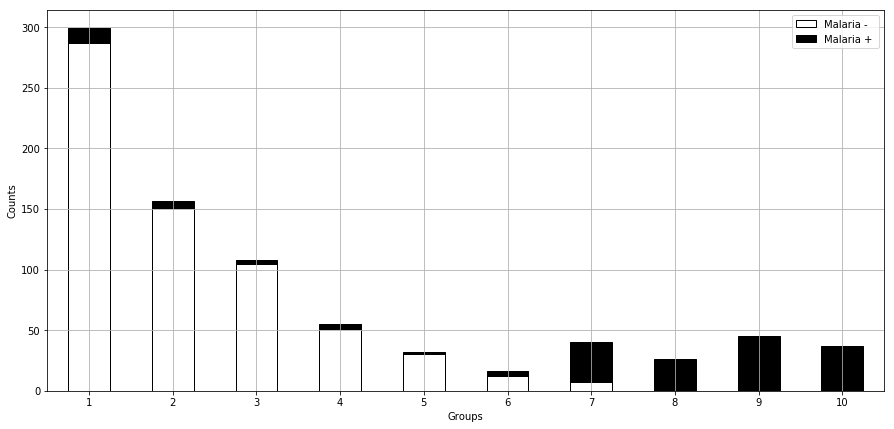

In [101]:
fig, ax = plt.subplots(figsize=(15,7))
malaria_pos.groupby(["binned","ground_truth"]).size().unstack().plot.bar(stacked=True, 
                                                                         ax=ax,
                                                                         color=["white","black"],
                                                                         edgecolor=["black"])
ax.legend(["Malaria -","Malaria + "])
ax.set_ylabel("Counts")
ax.set_xlabel("Groups")
ax.xaxis.set_tick_params(rotation=0)
ax.grid(True)
plt.show()



Above:
- we are only considering the probability of classifying a data point as being POSITIVE, instead of giving a POSITIVE/NEGATIVE result. A POSITIVE result of 0.5 or above = POSITIVE, while a POSITIVE result of less than 0.5 = NEGATIVE.
- above: white = you are malaria NEGATIVE; black = you are malaria POSITIVE  
- there are 10 bins, from 1 to 10, which indicate a "severity" score based on model prediction probability of "positive"

We divided the predictions (on the test set) into 11 different bins which each correspond to a level of "certainty" of the prediction. Within each group, we showed how many values were actually malaria positive. We can see that in the bin with the lowest probability of classification as "positive" (so a very high probability of classifying as "negative"), we still have some cases of mis-classification.

It is vital to think about where we expect errors to be made. Since the decision threshold of the model is at 0.5, we expect mis-classifications to be most present in the bins corresponding to a neighborhood around that threshold. There is a lot of uncertainty around these bins, since the model prediction could have gone "one way or the other" with only a little difference in the input value. Conversely, the bins/groups at both extremes of the plot are way more "certain", for the same reason.

A reminder about the dataset: the label is "malaria **positive**" so a score of 0 indicates malaria-negative while a score of 1 indicates malaria-positive. In the sklearn libraries, when returning probabilities, they are in the form \[p1,p2\] where p1 indicates the probability of the first possible outcome (in our case, malaria-negative) and p2 indicates the second possible outcome (in the case of a binary classification algorithm).

**CAUTION CAUTION CAUTION**
- threshold for binary choice = 0.5
--> KEEP THAT IN MIND WHEN LOOKING AT BINS, 
- we binned acoording to "proba" of predictions. If proba is at 0.5, it is sort of half half between would declare positive and would declare negative

- DOES it make sense to split / bin based on probability of prediction of being +?
    - WHY DIFFICULT CHOICE? because when we plot precision / else: these are threshold based, might mess up right along the threshold...

#### Creating a "threshold" at which we are certain to treat the most probable positive cases

In [102]:
# only select [:,1] == probabilities for the positive class ONLY
probas = model_forest.predict_proba(val_X)[:, 1]

sens,spec=[],[]
bins[0]=0
bins[-1]=1
for thresh in bins:
    preds=get_preds(thresh, probas)
    tn, fp, fn, tp = np.ravel(metrics.confusion_matrix(val_y, preds))
    spec_temp = tn/(tn+fp)
    sens_temp = tp/(tp+fn)
    spec.append(spec_temp*100)
    sens.append(sens_temp*100)
spec.pop()
sens.pop();

In [103]:
t= malaria_pos.groupby(["binned","ground_truth"]).size().unstack()
t= t.reset_index(drop=True).rename({0:"ground_truth=0", 1:"ground_truth=1"},axis=1)
# // TO DO check that is this correct
t["ground_truth=1"].fillna(0., inplace=True)
t["ground_truth=0"].fillna(0., inplace=True)
t.reset_index(inplace=True)
t["sum"] = t.apply(lambda x: x["ground_truth=0"]+x["ground_truth=1"],axis=1)
t["cumsum"]=t["sum"].cumsum()
t["rev_cumsum"] = t.loc[::-1,"sum"].cumsum()[::-1]

In [104]:
# in number of people you want to treat
usr_def_thr = 400

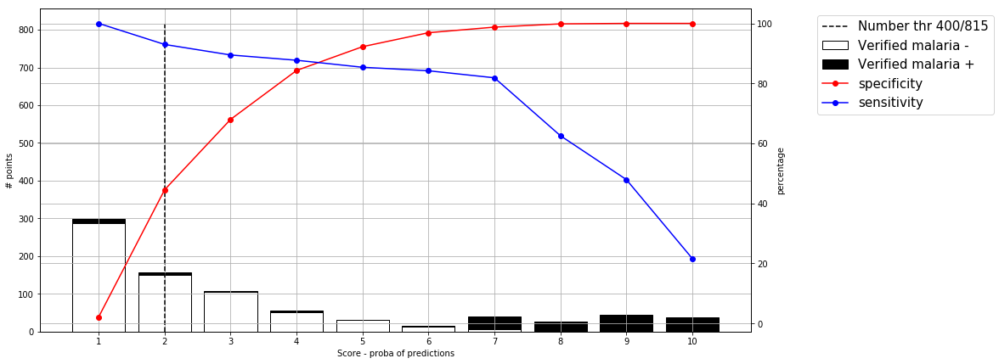

In [105]:
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams['axes.facecolor'] = 'white'


fig, ax1 = plt.subplots(figsize=(15,7))

b1=ax1.bar(x=t["index"],\
           height=t["ground_truth=0"], 
           color="white", 
           edgecolor="black", 
           label="Verified malaria -",
           zorder=-1)
b2=ax1.bar(x=t["index"], 
           height=t["ground_truth=1"],
           bottom=t["ground_truth=0"], 
           color="black", 
           edgecolor="black", 
           label = "Verified malaria +",
           zorder=-1)

ax1.vlines(t[(t.rev_cumsum>usr_def_thr)]["index"].tail(1),
           ymin=0,
           ymax=len(val_y),
           color="k",
           linestyle="--",
           label="Number thr {}/{}".format(usr_def_thr,int(t["cumsum"].iloc[-1])))
ax1.set_xlabel("Score - proba of predictions")
ax1.set_ylabel("# points")


ax2 = ax1.twinx()

p1=ax2.plot(np.arange(0,nbins-1),
            spec, "ro-",
            label = "specificity")
p2=ax2.plot(np.arange(0,nbins-1),
            sens, "bo-", 
            label = "sensitivity")

ax2.set_ylabel("percentage")


lines1, labels1 = ax1.get_legend_handles_labels()

lines2, labels2 = ax2.get_legend_handles_labels()

ax2.legend(lines1 + lines2, labels1 + labels2, loc=1, bbox_to_anchor=(1.35,1), fontsize=15)

plt.xticks(np.arange(0,nbins-1), binlabels, rotation='vertical')

ax1.grid(True)
ax2.grid(True)
plt.show()



Reminder: 

$\text{specificity} = \frac{TN}{(TN+FP)} $

$\text{sensitivity} = \frac{TP}{TP+FN}$

Above, we kept the different probabilistic categories from before. Then we decided to plot a sensitivity and specificity curve, with each point from the curve being constructed using the same thresholds as for the bins/categories.

This means that if the categories were constructed as chance of classification

0.0-0.33, 0.33-0.66, 0.66-1.0, 

the thresholds are 

0.33, 0.66, 1.0.

#### Retrieving the patients associated to the different severity scores / bins
Now we should retrieve the people that were categorized in each bin:

In [106]:
bin_choice=10
goi_idx = malaria_pos.index[malaria_pos["binned"]==bin_choice].tolist()
goi = val_X.iloc[goi_idx]
goi.head()

,sign_pallor,symp_eye,symp_skin,symp_vomit,post-rainy,dem_age_int,signv_temp_d0,sign_skininf,rainy,dem_sex,...,symp_fev24h,symp_abdopain,signv_rr1_d0,symp_cough,symp_dyspnea,symp_diarrhea,sign_skin_sev,sign_measles,symp_pharyngitis,days_of_fever
2910,0.0,0.0,0.0,0.0,1.0,0.105263,0.311111,0.0,0.0,1.0,...,1.0,0.0,0.185714,1.0,0.0,0.0,0.0,0.0,0.0,0.107143
3141,0.0,0.0,0.0,0.0,1.0,0.210526,0.511111,0.0,0.0,0.0,...,0.0,1.0,0.685714,0.0,0.0,0.0,0.0,0.0,0.0,0.178571
3085,0.0,0.0,0.0,0.0,0.0,0.315789,0.533333,0.0,0.0,0.0,...,0.0,1.0,0.114286,0.0,0.0,0.0,0.0,0.0,0.0,0.142857
2545,0.0,0.0,0.0,1.0,1.0,0.000000,0.133333,0.0,0.0,0.0,...,1.0,0.0,0.442857,0.0,0.0,1.0,0.0,0.0,1.0,0.107143
3206,0.0,0.0,0.0,0.0,1.0,0.105263,0.044444,0.0,0.0,1.0,...,1.0,0.0,0.342857,0.0,0.0,0.0,0.0,0.0,0.0,0.107143


#### Interactive plot to select threshold on severity score


In [107]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [108]:
nfigs=6
ndots=20

thr_lim = t[(t.rev_cumsum>usr_def_thr)]["index"].tail(1)
thr=np.arange(0,10,1)
low=0
high=np.max(t["sum"])


fig = make_subplots(specs=[[{"secondary_y": True}]])


for step in np.arange(0,10,1):
    fig.add_trace(
        go.Scatter(visible=False,
                   x=np.linspace(0,t["sum"].shape[0]-1,t["sum"].shape[0]),
                   y=t["sum"],
                   name="Sum",
                   mode="markers",
                   marker=dict(
                       symbol="line-ew",
                       size=15,
                       line_width=2,
                   ),
        ),
    secondary_y=False
    )
    fig.add_trace(
        go.Bar(visible=False,
               x=t["index"],
               y=t["ground_truth=0"],
               marker_color="white",
               name="Malaria -",
        ),
        secondary_y=False
    )
    fig.add_trace(
        go.Bar(visible=False,
               x=t["index"],
               y=t["ground_truth=1"],
               marker_color="LightSlateGrey",
               name="Malaria +",
        ),
        secondary_y=False
    )
    fig.add_trace(
        go.Scatter(visible=False,
                   x=np.arange(0,nbins-1),
                   y=sens,
                   mode="lines+markers",
                   name="Sensitivity",
                   marker_color="blue",
        ),
    secondary_y=True
    )
    fig.add_trace(
        go.Scatter(visible=False,
                   x=np.arange(0,nbins-1),
                   y=spec,
                   mode="lines+markers",
                   name="Specificity",
                   marker_color="red",
        ),
    secondary_y=True
    )
    fig.add_trace(
        go.Scatter(visible=False,
                   x=np.repeat(thr[step],ndots),
                   y=np.linspace(low,high,ndots),
                   mode="lines",
                   line = dict(color='black', width=2, dash='dash'),
                   name="Threshold {}".format(step),
                   marker_color="black",
                   hovertemplate="Selected People: "+str(t[t.index==step]["rev_cumsum"].values[0])
                  ),
    secondary_y=False
    )
    

assert(len(fig.data)%nfigs==0)
    
for i in range(nfigs):
    fig.data[i].visible=True


steps=[]

for i in range(0, len(fig.data), nfigs):
    step=dict(
    method="update",
    label="Thr {}".format(i//nfigs),
    args=[{"visible":[False]*len(fig.data)},
         {"title":"Threshold set to {} / {}".format(str(t[t.index==i//nfigs]["rev_cumsum"].values[0]),
                                                   str(t["cumsum"].iloc[-1]))}])
    for j in range(nfigs):
        step["args"][0]["visible"][i+j]=True    
    steps.append(step)
    

                 
                 
                 
sliders = [dict(
    active=10,
    pad={"t":50},
    steps=steps)]

    

fig.update_xaxes(
    tickangle = 0,
    title_text = "Bin / Severity Group",
    title_font = {"size": 15},
    nticks=20,
    title_standoff = 20)


 
fig.update_layout(
    yaxis1=dict(
        title="Number of People",
        titlefont=dict(
            color="black"
        ),
        tickfont=dict(
            color="black"
        )
    ),
    yaxis2=dict(
        title="Percentage",
        titlefont=dict(
            color="black"
        ),
        tickfont=dict(
            color="black"
        ),
        side="right",
        position=1),
)

fig.update_layout(
    legend=dict(
        traceorder="reversed",
        title_font_family="Times New Roman",
        font=dict(
            family="Courier",
            size=12,
            color="black"
        ),
        orientation="h",
        xanchor="right",
        x=0.94,
        yanchor="bottom",
        y=1.01,
        bgcolor="LightGrey",
        bordercolor="Black",
        borderwidth=1,
    )
)

fig.update_layout(
    title={
        'text':"Severity Score <br>Threshold set to {} / {}".format(str(t[t.index==0]["rev_cumsum"].values[0]),
                                                 str(t["cumsum"].iloc[-1])),
        'y':0.95,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'})




fig.update_layout(sliders=sliders, barmode="stack",
)
fig.update_layout(hovermode="x unified")



#### Feature analysis PER predictive-probabilistic group
Now we will conduct feature analyses on the different bins separately, in order to see if some features are differently important 

In [109]:
perms=[]
for i in range(len(bins)-1):
    current_df = malaria_pos[malaria_pos.binned==i+1]
    current_df = current_df[list(set(all_categorical+numerical) - set(["lab_malaria_any_d0"]))]
    perm = eli5.sklearn.PermutationImportance(model_forest, random_state=1)\
    .fit(current_df, malaria_pos[malaria_pos.binned==i+1]["ground_truth"])
    perms.append(perm)
    eli5.show_weights(perm, feature_names = current_df.columns.tolist())

# gb = malaria_pos.groupby(["binned"])
# bins= gb.apply(lambda grp: )

In [110]:
eli5.show_weights(perms[0],feature_names=current_df.columns.tolist())

Weight,Feature
0.0013 ± 0.0033,signv_temp_d0
0.0007 ± 0.0027,symp_diarrhea
0.0007 ± 0.0027,dem_age_int
0 ± 0.0000,signv_rr1_d0
0 ± 0.0000,symp_vomit
0 ± 0.0000,post-rainy
0 ± 0.0000,sign_skininf
0 ± 0.0000,rainy
0 ± 0.0000,dem_sex
0 ± 0.0000,symp_feveronly


This is the feature permutation for the group that was deemed least likely to be malaria-positive. The most prominant features in determining the outcome seemed to be `symp_diarrhea` and `symp_abdopain`.

In [111]:
eli5.show_weights(perms[len(bins)-2],feature_names=current_df.columns.tolist())

Weight,Feature
0.5081 ± 0.0930,signv_temp_d0
0.3568 ± 0.0630,symp_cough
0.3135 ± 0.0551,symp_vomit
0.3135 ± 0.1113,dem_age_int
0.2486 ± 0.0865,signv_rr1_d0
0.2432 ± 0.0837,dem_sex
0.1892 ± 0.0764,symp_fev24h
0.1676 ± 0.0717,post-rainy
0.1514 ± 0.0878,symp_feveronly
0.1243 ± 0.1003,days_of_fever


This is the feature permutation for the group that was deemed most likely to be malaria-positive. The most prominant features in determining the outcome seemed to be `signv_temp_d0`, `symp_cough`, `dem_age_int` and `signv_rr1_d0`.

We can see above that different bins have different results for permutation importance.

We had seen that the `signv_rr1_d0` feature was not deemed important in previous feature selection methods. Let's take a look at a SHAP explainer on this specific group!

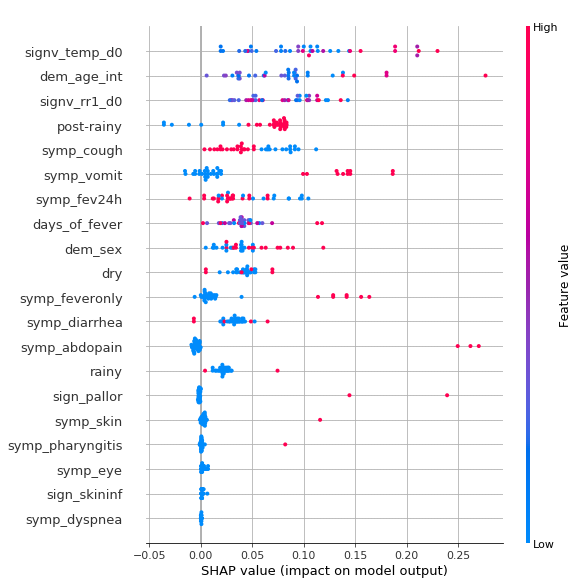

In [112]:
shap_explainer = shap.TreeExplainer(model_forest)
shap_values = shap_explainer.shap_values(goi)
shap.summary_plot(shap_values[1], goi)

We can see a little bit more clearly the patern in the feature of interest.

**REMEMBER**, here are deliberately selecting inputs for which we know the model to have made a "STRONG" choice (those with high associated probability) - which also  means that we are only looking at a SUBSET of the dataset. This means we should be extra-careful in the way we interpret our results.

## Uncertainty measures

We are trying to measure both aleatoric and epistemic uncertainties:
- aleatoric uncertainty: inherent to the data/process we are explaining
- epistemic uncertainty: attributed to an inadequate knowledge of the model most suited to explain the data.

We will try to quantify aleatoric uncertainty, and to reduce and quantify episetmic uncertainty.
    

### Bootstrapping results

In [113]:
scores = []
n_boot=20
n_sample = len(val_X)
for i in range(n_boot):
    indices = np.random.randint(0,n_sample,n_sample)
    preds = model_forest.predict(val_X.values[indices])
    score = metrics.accuracy_score(preds, val_y.values[indices])
    scores.append(score)
print(np.mean(scores))

0.9413496932515336


### Confidence intervals
All of below might be wrong

In [114]:
# compute CI as the middle 95% of observed statistical values centered around median
alpha = 0.5
# 2.5th
lower_p = alpha/2.0
lower = max(0.0, np.percentile(scores, lower_p))
upper_p= (100-alpha)+(alpha/2)
upper=min(1.0, np.percentile(scores, upper_p))

print(lower,upper)

0.9184907975460124 0.9557699386503068


In [115]:
scores = []
uppers = []
lowers = []
errors=[]
n_boot=100
n_sample = len(val_X)


const = 1.96
# const = 2.33
# const=1.645

for i in range(n_boot):
    indices = np.random.randint(0,n_sample,n_sample)
    preds = model_forest.predict(val_X.values[indices])
    score = metrics.accuracy_score(preds, val_y.values[indices])
    scores.append(score)
    
    error = const*np.sqrt(score*(1-score)/n_sample)
    lowers.append(score-error)
    uppers.append(score+error)
    errors.append(error)


    
oob = [(x or y) for x,y in zip(uppers<np.mean(scores),lowers>np.mean(scores))]
oob_idx = [i for i,x in enumerate(oob) if x==True]

oob_scores =[scores[i] for i in oob_idx]
oob_errors = [errors[i] for i in oob_idx]
oob_uppers = [uppers[i] for i in oob_idx]
oob_lowers = [lowers[i] for i in oob_idx]

mean=np.mean(scores)

print("mean: {:.5f}\nCI: [{:.5f} ; {:.5f}]\n\nRounded to 5 decimals".format(mean,np.mean(lowers), np.mean(uppers)))
# [upper-lower for upper,lower in zip(uppers,lowers)]

mean: 0.94259
CI: [0.92666 ; 0.95851]

Rounded to 5 decimals


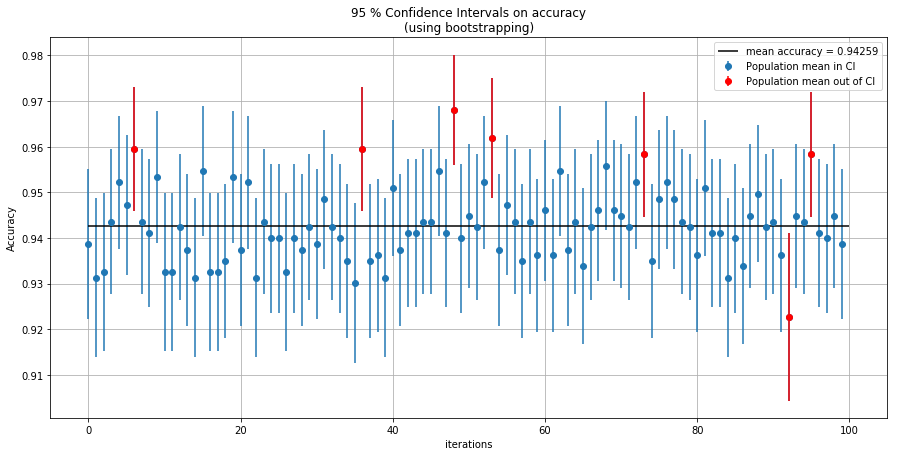

In [116]:
fig, ax  = plt.subplots(figsize=(15,7))

ax.errorbar(x=range(len(scores)),
             y=scores,
             yerr=errors,
            fmt='o',
           label = "Population mean in CI")

ax.hlines(xmin=0, xmax=len(scores), y=np.mean(scores), color='k',label="mean accuracy = {:.5f}".format(np.mean(scores)))


ax.errorbar(x=oob_idx,
            y=oob_scores,
            yerr=oob_errors,
            fmt='o',
            color='red',
            label='Population mean out of CI')

ax.set_xlabel("iterations")
ax.set_ylabel("Accuracy")
ax.set_title("95 % Confidence Intervals on accuracy\n(using bootstrapping)")
ax.legend()
ax.grid(True, axis="y")
plt.show()

above: is sort of totally useless lol

Shows you the actual bootstrapping process.